# MSC Traffic

In [29]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import tensorflow as tf
import os
from numpy import sqrt

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

In [3]:
from google.colab import files
!ls

ModuleNotFoundError: No module named 'google.colab'

In [4]:
from google.colab import files
!rm 'msc_traffic_daily_1year_10nodes.csv'

ModuleNotFoundError: No module named 'google.colab'

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving msc_traffic_daily_1year_10nodes.csv to msc_traffic_daily_1year_10nodes.csv


In [30]:
#DATA LOADING
data = pd.read_csv("./msc_traffic_daily_1year_10nodes.csv")
data.drop("Unnamed: 1", axis=1, inplace=True)

In [31]:
# Transpose
data = data.T

In [32]:
# make first row as column headers and select all rows except the first
data.columns = data.iloc[0]
data = data[1:]
data = data.rename(columns=({"index":"Date"}))
data.index = pd.to_datetime(data.index)

In [33]:
# column names
cols = [data.columns]

In [34]:
# print head
data.head(5)



MSC_Id,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
2020-04-02,187.01,188.707,392.815,404.656,394.526,192.923,191.026,242.923,105.998,195.443
2020-04-03,167.944,169.101,365.096,377.441,366.216,163.32,161.87,213.32,169.104,165.118
2020-04-04,176.854,179.022,385.117,396.222,385.568,180.25,178.498,230.25,188.099,182.257
2020-04-05,184.058,185.516,394.592,403.395,394.143,194.058,193.104,244.058,201.026,196.785
2020-04-06,185.561,187.6,396.516,404.717,397.48,202.098,199.946,252.098,210.269,203.757


In [35]:
# print tail
data.tail(5)

MSC_Id,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
2021-04-02,161.253,162.989,309.678,333.392,307.955,152.999,138.468,202.999,194.302,153.917
2021-04-03,180.222,181.657,337.292,362.338,335.767,177.654,162.496,227.654,228.045,179.374
2021-04-04,187.117,189.028,346.482,372.988,346.15,191.455,176.671,241.455,246.853,192.928
2021-04-05,186.749,188.786,345.958,371.412,345.946,191.824,177.18,241.824,248.553,193.073
2021-04-06,188.622,190.014,347.386,372.678,347.595,193.856,179.343,243.856,250.718,194.612


In [36]:
data.shape

(370, 10)

In [37]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 370 entries, 2020-04-02 to 2021-04-06
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   NR_MSC_1   367 non-null    object
 1   NR_MSC_2   367 non-null    object
 2   NR_MSC_3   367 non-null    object
 3   NR_MSC_4   367 non-null    object
 4   NR_MSC_5   367 non-null    object
 5   NR_MSC_6   367 non-null    object
 6   NR_MSC_7   367 non-null    object
 7   NR_MSC_8   368 non-null    object
 8   NR_MSC_9   368 non-null    object
 9   NR_MSC_10  365 non-null    object
dtypes: object(10)
memory usage: 31.8+ KB


In [38]:
# imputation
print(data.isnull().sum())
data = data.fillna(method='bfill')
print(data.isnull().sum())

MSC_Id
NR_MSC_1     3
NR_MSC_2     3
NR_MSC_3     3
NR_MSC_4     3
NR_MSC_5     3
NR_MSC_6     3
NR_MSC_7     3
NR_MSC_8     2
NR_MSC_9     2
NR_MSC_10    5
dtype: int64
MSC_Id
NR_MSC_1     0
NR_MSC_2     0
NR_MSC_3     0
NR_MSC_4     0
NR_MSC_5     0
NR_MSC_6     0
NR_MSC_7     0
NR_MSC_8     0
NR_MSC_9     0
NR_MSC_10    0
dtype: int64


In [39]:
# Describe the data
data.describe()

MSC_Id,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
count,370.000000,370.000000,370.000000,370.000000,370.000000,370.000000,370.000000,370.000000,370.000000,370.000000
mean,176.033454,181.864008,361.171105,370.951581,360.112824,180.139700,176.279632,230.208000,195.749962,178.277389
std,27.148008,15.473796,38.954597,44.582784,39.208563,20.926092,19.142260,20.918206,32.258239,28.002140
min,21.817000,146.873000,295.061000,156.417000,293.644000,133.206000,117.798000,183.206000,34.260000,14.180000
25%,171.264250,174.242750,338.691750,353.031500,337.597250,170.647000,165.970000,220.920500,175.536000,167.983750
50%,180.057000,182.185000,349.150500,367.498500,348.492000,180.690000,179.383000,230.830000,193.995500,181.218000
75%,187.090250,189.209500,390.338500,399.266500,389.893250,191.375000,185.777750,241.375000,218.437000,191.453750
max,345.856000,346.599000,707.257000,722.733000,708.593000,310.177000,306.639000,360.177000,310.169000,311.070000


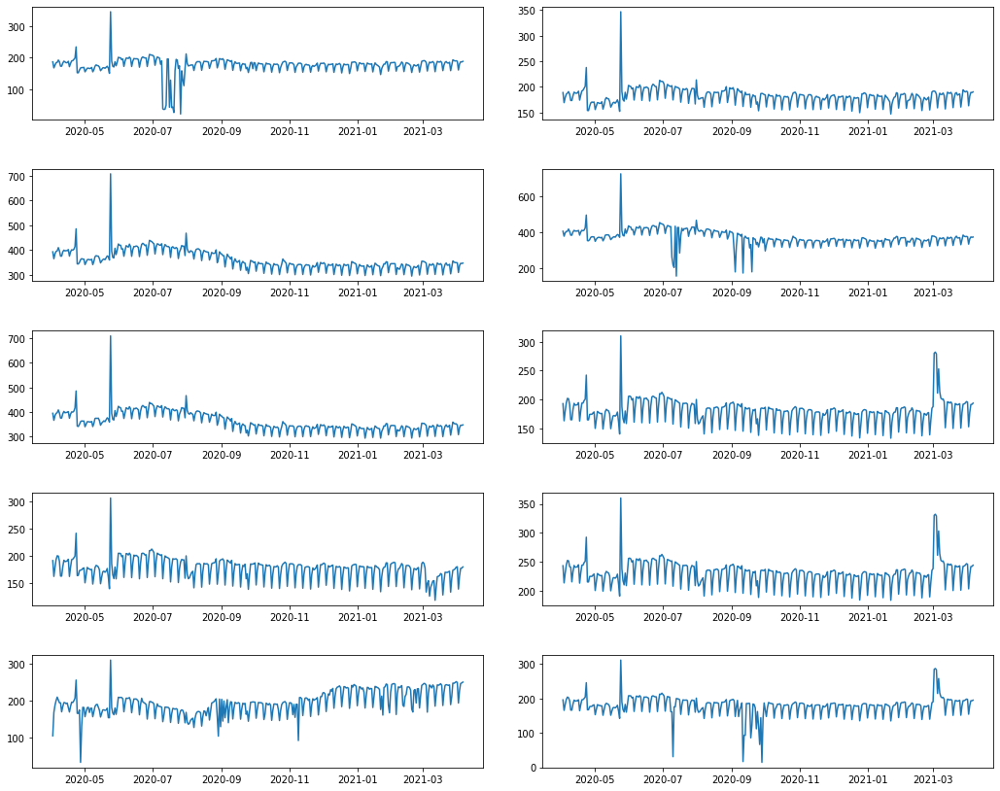

In [40]:
fig, ax = plt.subplots(5, 2, figsize=(15, 12))
fig.tight_layout(pad=3)
ax[0, 0].plot(data.index, data['NR_MSC_1'])
ax[0, 1].plot(data.index, data['NR_MSC_2'])
ax[1, 0].plot(data.index, data['NR_MSC_3'])
ax[1, 1].plot(data.index, data['NR_MSC_4'])
ax[2, 0].plot(data.index, data['NR_MSC_5'])
ax[2, 1].plot(data.index, data['NR_MSC_6'])
ax[3, 0].plot(data.index, data['NR_MSC_7'])
ax[3, 1].plot(data.index, data['NR_MSC_8'])
ax[4, 0].plot(data.index, data['NR_MSC_9'])
ax[4, 1].plot(data.index, data['NR_MSC_10'])

In [41]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Initialize figure with subplots
fig = make_subplots(
    rows=5, cols=2, subplot_titles=("NR_MSC_1", "NR_MSC_2", "NR_MSC_3", "NR_MSC_4", "NR_MSC_5", "NR_MSC_6", "NR_MSC_7", "NR_MSC_8", "NR_MSC_9", "NR_MSC_10")
)

# Add traces
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_1'], name = "NR_MSC_1"), row=1, col=1)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_2'], name = "NR_MSC_2"), row=1, col=2)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_3'], name = "NR_MSC_3"), row=2, col=1)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_4'], name = "NR_MSC_4"), row=2, col=2)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_5'], name = "NR_MSC_5"), row=3, col=1)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_6'], name = "NR_MSC_6"), row=3, col=2)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_7'], name = "NR_MSC_7"), row=4, col=1)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_8'], name = "NR_MSC_8"), row=4, col=2)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_9'], name = "NR_MSC_9"), row=5, col=1)
fig.add_trace(go.Scatter(x=data.index, y=data['NR_MSC_10'], name = "NR_MSC_10"), row=5, col=2)

fig.update_layout(title_text="MSC Traffic", height=1500)

fig.show()

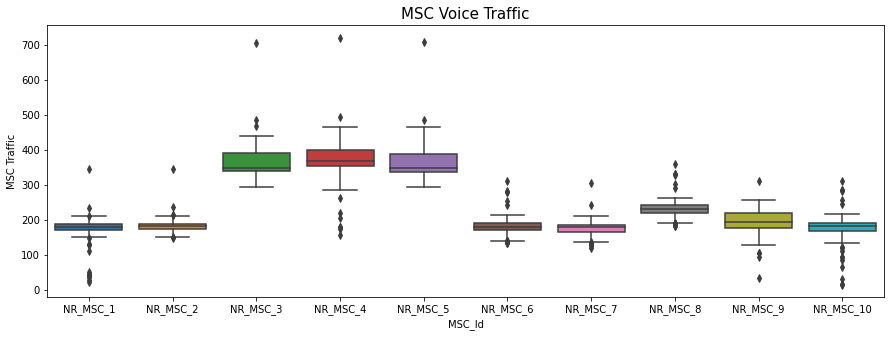

In [42]:
#drawing figure with title and single axis. Size and resolution are specified
plt.figure(figsize=(15,5));
plt.title('MSC Voice Traffic',fontsize=15);

#setting y axis label
plt.ylabel('MSC Traffic');

#rotating x axis ticks by 90 degrees
plt.xticks(rotation=0);

#drawing boxplot for
sns.boxplot(data=data);

In [43]:
#fig = px.box(data, x=data['NR_MSC_1'], y=data.index)
#fig.show()

import plotly.graph_objects as go

fig = go.Figure()

for col in data:
  fig.add_trace(go.Box(y=data[col].values, name=data[col].name))

fig.update_layout(title_text="MSC Traffic", height=700)
                    
fig.show()

In [44]:
def plot_train_test_pred(train, test, predicted):
    fig = plt.figure(figsize=(15, 4))
    fig.suptitle("Train, Test, and Forecast plots")
    past, = plt.plot(train.index, train, 'r.-', label="Train")
    future, = plt.plot(test.index[-70:], test[-70:], color ='blue', label="Test")
    #predicted_future, = plt.plot(test.index[-70:], predicted[-70:], 'g.-', label="Predicted")
    predicted_future, = plt.plot(test.index[370:], predicted[370:], 'g.-', label="Predicted")
    #forecast, = plt.plot(test.index[85:], predicted[85:0], 'b.-', label="Forecast")
    plt.legend()
    plt.show()

In [45]:
#Plotting Functions
def plot_train_test_pred(train, test, predicted):
    fig = plt.figure(figsize=(15, 4))
    fig.suptitle("Train, Test, and Forecast plots")
    past, = plt.plot(train.index, train, 'r.-', label="Train")
    future, = plt.plot(test.index[-70:], test[-70:], color ='blue', label="Test")
    predicted_future, = plt.plot(test.index[-70:], predicted[-70:], 'g.-', label="Predicted")
    plt.legend()
    plt.show()
    
def plot_forecasts(df):
    fig, axs = plt.subplots(5, 2, figsize=(20, 20), sharex=False)
    axx = axs.ravel()
    for i in range(0, 10):
        df[df.columns[i]].loc[str(df.iloc[[0]].index[0]).split(' ')[0] : str(df.iloc[[len(df)-1]].index[0]).split(' ')[0]].plot(ax=axx[i])
        
        axx[i].set_xlabel("date")
        axx[i].set_ylabel(df.columns[i])  


#### HOLT-WINTER EXPONENTIAL SMOOTHING

In [18]:
from matplotlib import pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

from statsmodels.tsa.holtwinters import ExponentialSmoothing as HWES

In [19]:
def train_test_split(data, n_test):
    return data[:-n_test], data[n_test:]

In [20]:
l = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [21]:
tr, te  = train_test_split(l, 3)
tr, te

([1, 2, 3, 4, 5, 6, 7], [4, 5, 6, 7, 8, 9, 10])

In [22]:
te[-4:]

[7, 8, 9, 10]

In [23]:
def measure_rmse(actual, predicted):
    return sqrt(mean_absolute_error(actual, predicted))

In [24]:
def exp_smoothing_forecast(history):
    #t, d, s, p, b, r = config
    history = np.array(history)
    model = HWES(history, seasonal='add', seasonal_periods=30)
    model_fit = model.fit(optimized=True)
    yhat = model_fit.predict(len(history), len(history))
    return yhat[0], model_fit

In [25]:
def walk_forward_validation(data, n_test, data_mode):
    forecast_15days, forecast_1Month, forecast_3Months = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
    for i in data.columns:
#         warnings.resetwarnings()
#         warnings.filterwarnings('ignore')
        print("Fitting ", i)
        curr_data = data[i]
        predictions = list()
        train, test = train_test_split(curr_data, n_test)
        history = [x for x in train]
        for k in range(len(test)):
            yhat, model = exp_smoothing_forecast(history)
            predictions.append(yhat)
            history.append(test[k])
            
            
        
        mae = mean_absolute_error(test, predictions)
        mape = mean_absolute_percentage_error(test, predictions)
        mse = mean_squared_error(test, predictions)
        rmse = np.sqrt(mse)
        print("MAE  : ", mae)
        print("MAPE : ", mape)
        print("MSE  : ", mse)
        print("RMSE : ", rmse)
        
        plot_train_test_pred(train, test, predictions)
        
        # Forecast
       
        forecast_15days[i] = model.forecast((15+70))
        forecast_1Month[i] = model.forecast((30+70))
        forecast_3Months[i] = model.forecast((90+70))

        print("======================================")
        
    forecast_15days = forecast_15days.iloc[70:]
    forecast_1Month = forecast_1Month.iloc[70:]
    forecast_3Months = forecast_3Months.iloc[70:]
        
    forecast_15days["Date"] = pd.date_range(start= '2021-04-07', periods=15, freq='1D')
    forecast_15days = forecast_15days.set_index("Date")
    forecast_1Month["Date"] = pd.date_range(start= '2021-04-07', periods=30, freq='1D')
    forecast_1Month = forecast_1Month.set_index("Date")
    forecast_3Months["Date"] = pd.date_range(start= '2021-04-07', periods=90, freq='1D')
    forecast_3Months = forecast_3Months.set_index("Date")
            
    return forecast_15days, forecast_1Month, forecast_3Months

## Fitting daily data

Fitting  NR_MSC_1
MAE  :  14.50899725608417
MAPE :  0.14158659596614798
MSE  :  683.4246102394021
RMSE :  26.142391058191333


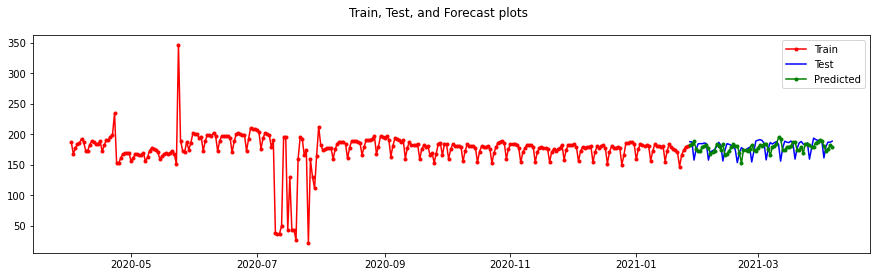

Fitting  NR_MSC_2
MAE  :  8.759892040176094
MAPE :  0.04976227137857092
MSE  :  135.8008301483681
RMSE :  11.653361324028708


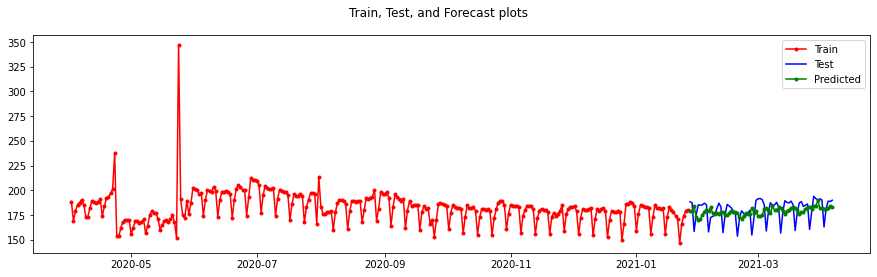

Fitting  NR_MSC_3
MAE  :  13.850342753318003
MAPE :  0.03976659248142301
MSE  :  389.6355289624571
RMSE :  19.739187646974155


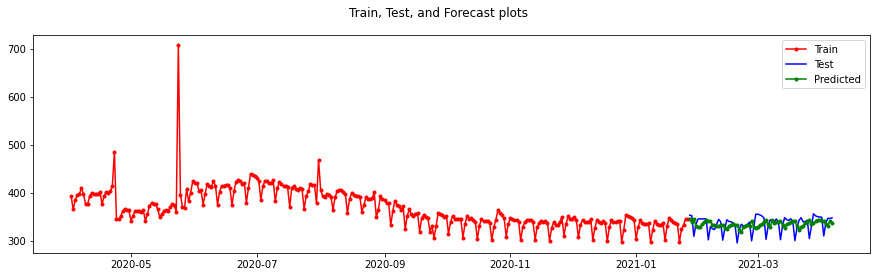

Fitting  NR_MSC_4
MAE  :  23.661459285059756
MAPE :  0.07454600551826232
MSE  :  1515.341653989338
RMSE :  38.92738950905054


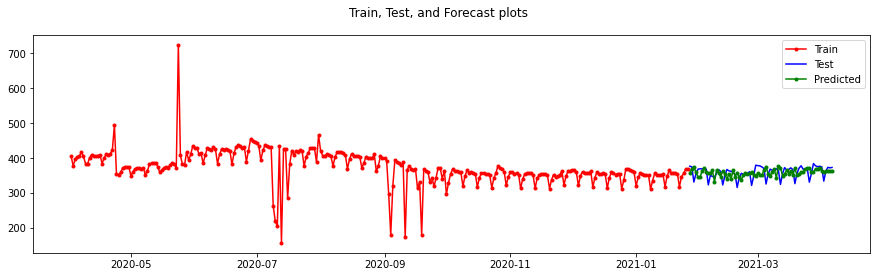

Fitting  NR_MSC_5
MAE  :  14.0163289709652
MAPE :  0.04047199692548982
MSE  :  401.8240247230717
RMSE :  20.045548750859172


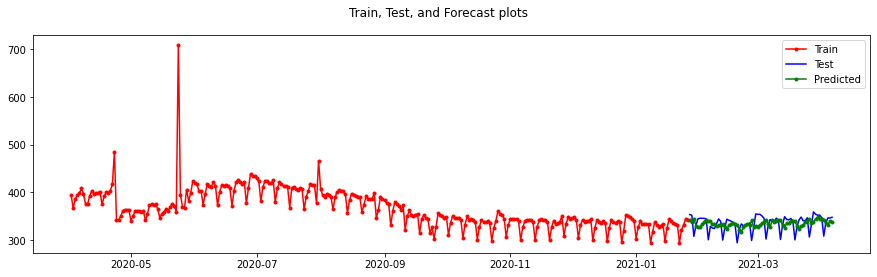

Fitting  NR_MSC_6
MAE  :  14.01086931675416
MAPE :  0.08135010699598956
MSE  :  401.9545797417934
RMSE :  20.048804945477258


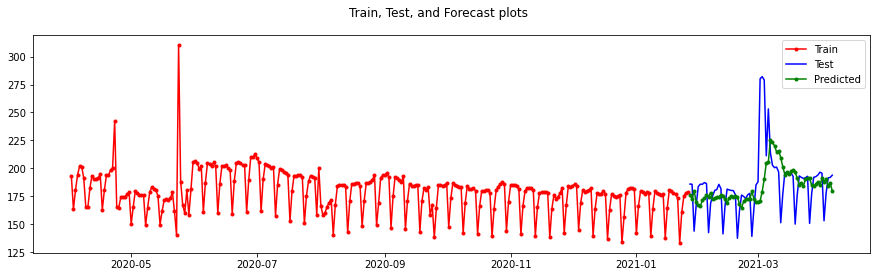

Fitting  NR_MSC_7
MAE  :  13.497215676794765
MAPE :  0.08264604858068215
MSE  :  299.85486137242646
RMSE :  17.31631777753072


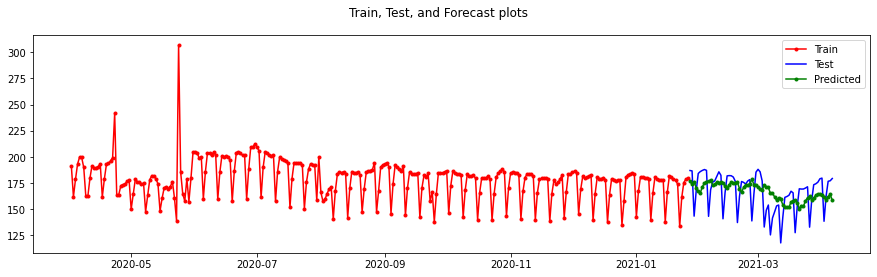

Fitting  NR_MSC_8
MAE  :  13.958277132511983
MAPE :  0.06252469250938333
MSE  :  398.0626553049594
RMSE :  19.95150759478991


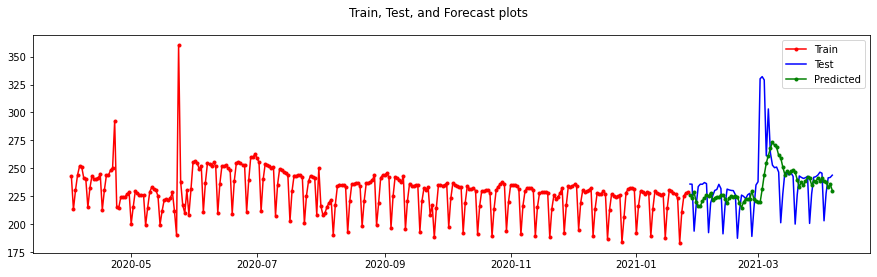

Fitting  NR_MSC_9
MAE  :  18.641785879843585
MAPE :  0.10188268368540067
MSE  :  565.1496966277356
RMSE :  23.772877331693266


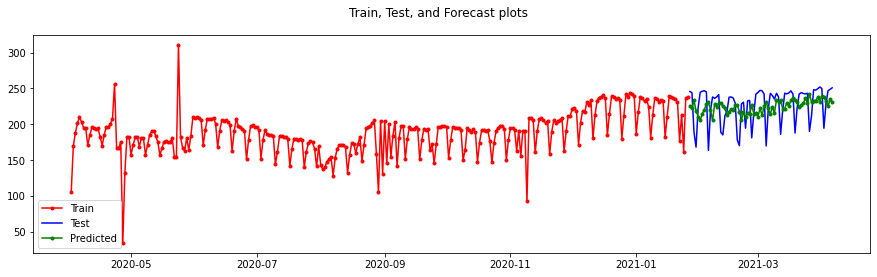

Fitting  NR_MSC_10
MAE  :  18.707316076535143
MAPE :  0.1841118950138593
MSE  :  800.7529147124483
RMSE :  28.297577894803087


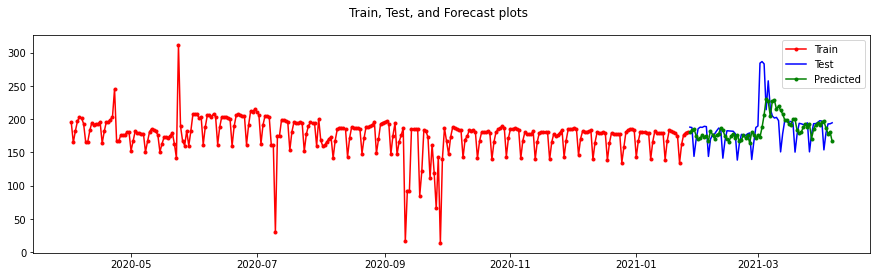

In [26]:
f15d, f1m, f3m = walk_forward_validation(data, 70, "Days")

In [27]:
f15d.shape, f1m.shape, f3m.shape

((15, 10), (30, 10), (90, 10))

In [28]:
f15d.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,179.715815,184.585224,343.627246,370.233806,343.323104,183.561771,167.138063,233.893842,239.195994,181.351048
2021-04-08,183.717312,184.967861,342.318388,357.000007,342.390219,183.984863,167.813884,234.536493,239.477409,185.811729
2021-04-09,181.133592,182.765987,336.961562,367.308703,336.667465,179.563761,163.587725,230.569729,229.394822,184.262892
2021-04-10,182.001867,183.466191,339.510451,358.098684,339.335484,181.892482,165.543068,232.402242,237.376253,181.042821
2021-04-11,184.617394,182.208972,336.863903,364.388128,336.537293,179.905339,163.559235,230.399298,234.866957,180.345016


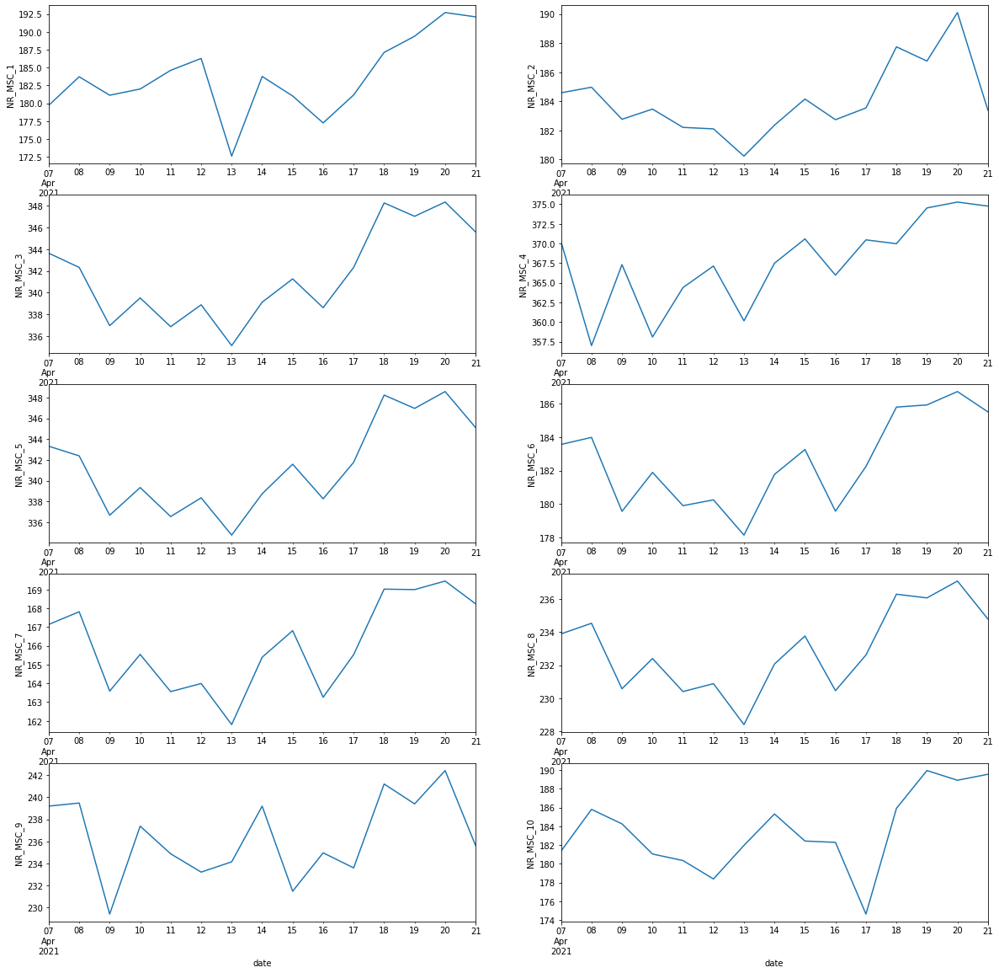

In [29]:
plot_forecasts(f15d)

In [30]:
f1m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,179.715815,184.585224,343.627246,370.233806,343.323104,183.561771,167.138063,233.893842,239.195994,181.351048
2021-04-08,183.717312,184.967861,342.318388,357.000007,342.390219,183.984863,167.813884,234.536493,239.477409,185.811729
2021-04-09,181.133592,182.765987,336.961562,367.308703,336.667465,179.563761,163.587725,230.569729,229.394822,184.262892
2021-04-10,182.001867,183.466191,339.510451,358.098684,339.335484,181.892482,165.543068,232.402242,237.376253,181.042821
2021-04-11,184.617394,182.208972,336.863903,364.388128,336.537293,179.905339,163.559235,230.399298,234.866957,180.345016


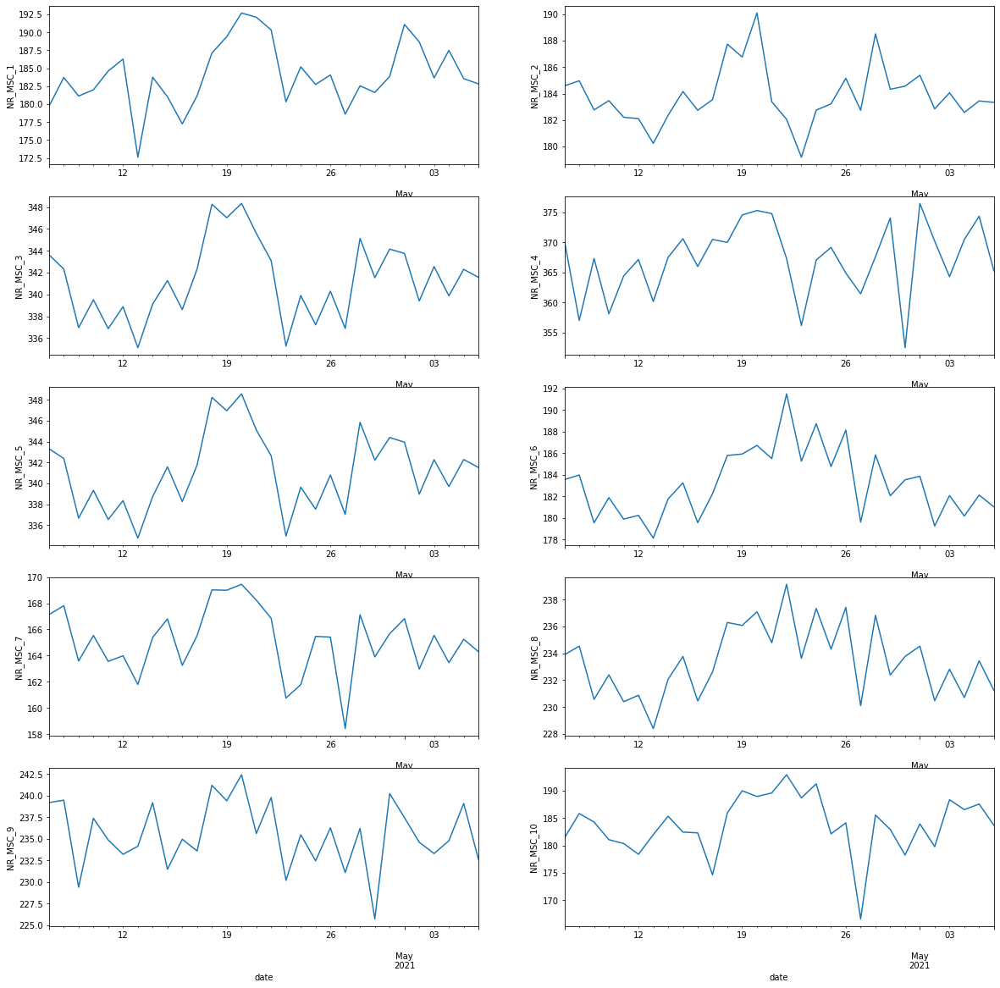

In [31]:
plot_forecasts(f1m)

In [32]:
f3m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,179.715815,184.585224,343.627246,370.233806,343.323104,183.561771,167.138063,233.893842,239.195994,181.351048
2021-04-08,183.717312,184.967861,342.318388,357.000007,342.390219,183.984863,167.813884,234.536493,239.477409,185.811729
2021-04-09,181.133592,182.765987,336.961562,367.308703,336.667465,179.563761,163.587725,230.569729,229.394822,184.262892
2021-04-10,182.001867,183.466191,339.510451,358.098684,339.335484,181.892482,165.543068,232.402242,237.376253,181.042821
2021-04-11,184.617394,182.208972,336.863903,364.388128,336.537293,179.905339,163.559235,230.399298,234.866957,180.345016


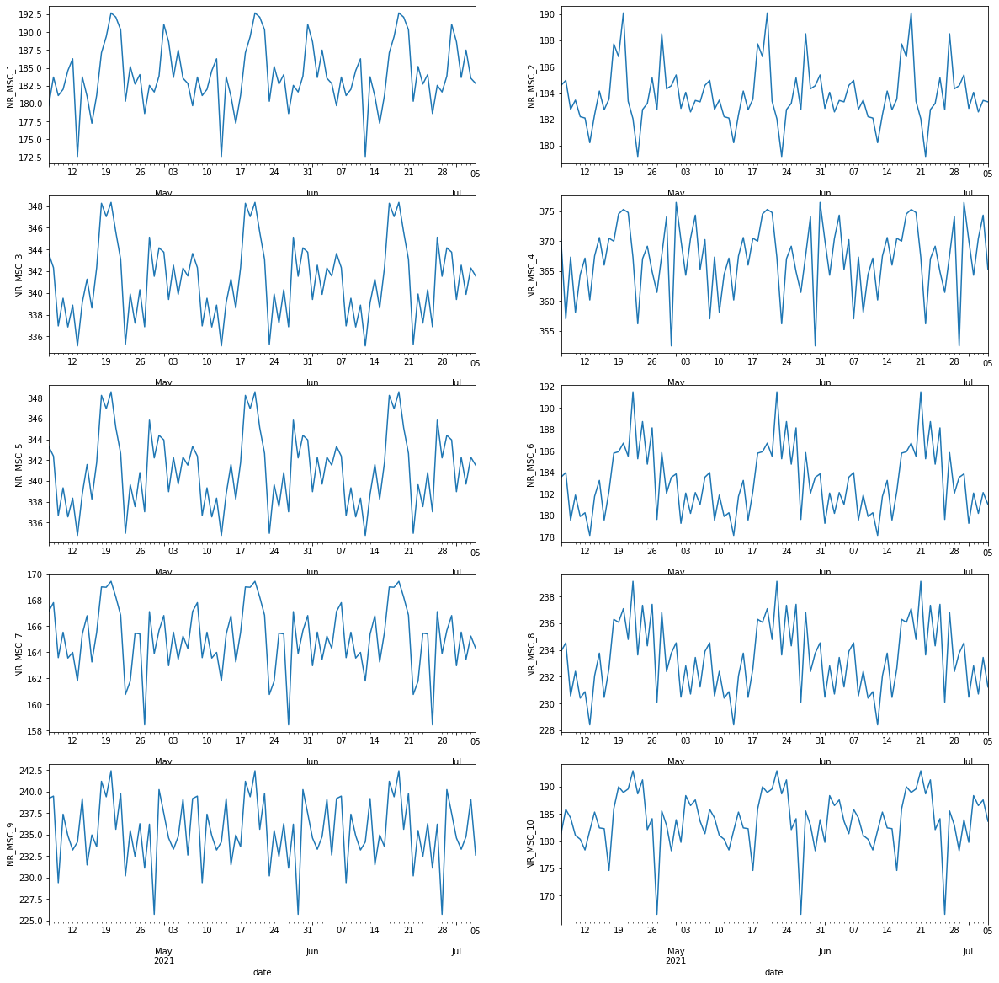

In [33]:
plot_forecasts(f3m)

### SARIMA

In [34]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [35]:
def train_test_split(data, n_test):
    return data[:-n_test], data[n_test:]

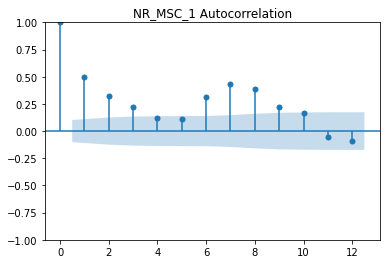

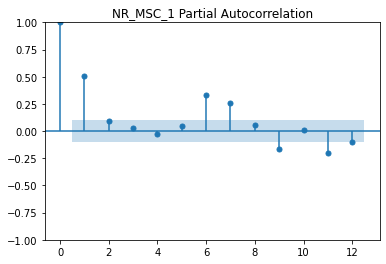

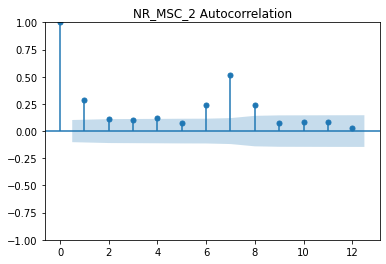

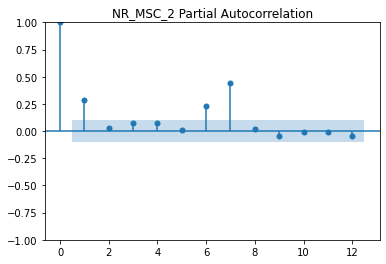

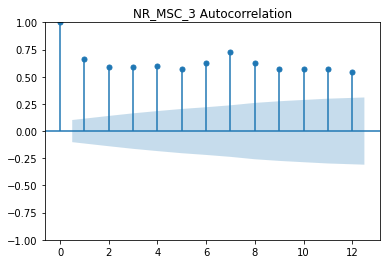

...

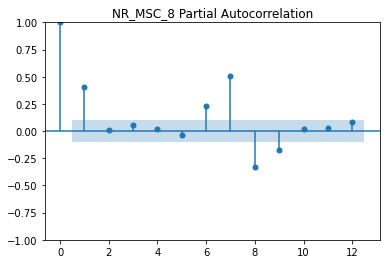

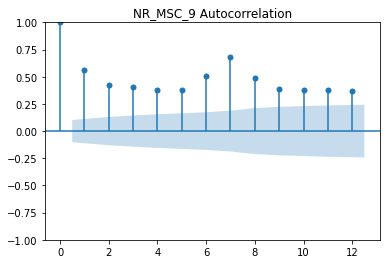

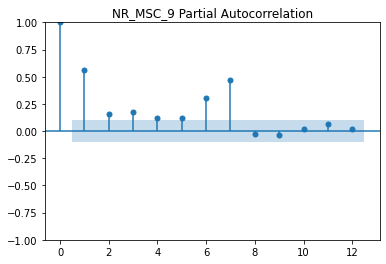

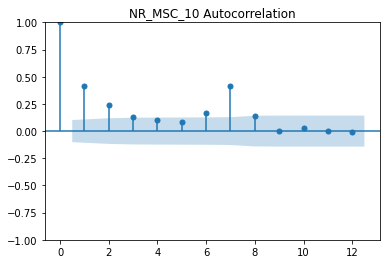

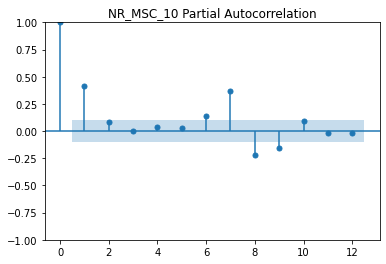

In [36]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
for i in data.columns:
    #print(i)
    plot_acf(data[i], lags=12, title=i + " Autocorrelation"), plot_pacf(data[i], lags=12, title= i + " Partial Autocorrelation")
    plt.show()

In [37]:
def measure_rmse(actual, predicted):
    return sqrt(mean_absolute_error(actual, predicted))

In [38]:
def sarima_forecast(history):
    history = np.array(history)
    model = SARIMAX(history, seasonal_order=(1, 1, 1, 7))
    model_fit = model.fit(optimized=True)
    yhat = model_fit.predict(len(history), len(history))
    #print("yhat", yhat)
    return yhat[0], model_fit

In [39]:
def plot(train, test, predicted):
    fig = plt.figure(figsize=(15, 4))
    fig.suptitle("Train, Test, and Forecast plots")
    past, = plt.plot(train.index, train, 'r.-', label="Train")
    future, = plt.plot(test.index[-70:], test[-70:], color ='blue', label="Test")
    predicted_future, = plt.plot(test.index[-70:], predicted[-70:], 'g.-', label="Predicted")
    plt.legend()
    plt.show()

In [40]:
data.columns

Index(['NR_MSC_1', 'NR_MSC_2', 'NR_MSC_3', 'NR_MSC_4', 'NR_MSC_5', 'NR_MSC_6',
       'NR_MSC_7', 'NR_MSC_8', 'NR_MSC_9', 'NR_MSC_10'],
      dtype='object', name='MSC_Id')

In [41]:
def walk_forward_validation(data, n_test):
    forecast_15days, forecast_1Month, forecast_3Months = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
    for i in data.columns:
        print("Fitting ", i)
        curr_data = data[i]
        predictions = list()
        train, test = train_test_split(curr_data, n_test)
        history = [x for x in train]
        for k in range(len(test)):
            yhat, model = sarima_forecast(history)
            predictions.append(yhat)
            history.append(test[k])
        
        mae = mean_absolute_error(test, predictions)
        mape = mean_absolute_percentage_error(test, predictions)
        mse = mean_squared_error(test, predictions)
        rmse = np.sqrt(mse)
        print("MAE  : ", mae)
        print("MAPE : ", mape)
        print("MSE  : ", mse)
        print("RMSE : ", rmse)
        
        # Forecast
       
        forecast_15days[i] = model.forecast((15+70))
        forecast_1Month[i] = model.forecast((30+70))
        forecast_3Months[i] = model.forecast((90+70))
        print("======================================")
        
    forecast_15days = forecast_15days.iloc[70:]
    forecast_1Month = forecast_1Month.iloc[70:]
    forecast_3Months = forecast_3Months.iloc[70:]
        
    forecast_15days["Date"] = pd.date_range(start= '2021-04-07', periods=15, freq='1D')
    forecast_15days = forecast_15days.set_index("Date")
    forecast_1Month["Date"] = pd.date_range(start= '2021-04-07', periods=30, freq='1D')
    forecast_1Month = forecast_1Month.set_index("Date")
    forecast_3Months["Date"] = pd.date_range(start= '2021-04-07', periods=90, freq='1D')
    forecast_3Months = forecast_3Months.set_index("Date")
            
    return forecast_15days, forecast_1Month, forecast_3Months

## Fitting daily data

In [43]:
f15d, f1m, f3m = walk_forward_validation(data, 70)

Fitting  NR_MSC_1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.64039D+00    |proj g|=  1.25059D-01


 This problem is unconstrained.



At iterate    5    f=  4.59288D+00    |proj g|=  2.41372D-02

At iterate   10    f=  4.53782D+00    |proj g|=  9.15631D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     18      1     0     0   3.605D-04   4.538D+00
  F =   4.5376376656825093     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.63974D+00    |proj g|=  1.24831D-01


 This problem is unconstrained.



At iterate    5    f=  4.59229D+00    |proj g|=  2.30258D-02

At iterate   10    f=  4.53976D+00    |proj g|=  3.28768D-02

At iterate   15    f=  4.53706D+00    |proj g|=  2.74960D-05

At iterate   20    f=  4.53705D+00    |proj g|=  1.30424D-03

At iterate   25    f=  4.53701D+00    |proj g|=  7.91686D-04

At iterate   30    f=  4.53700D+00    |proj g|=  1.82848D-04

At iterate   35    f=  4.53700D+00    |proj g|=  9.98884D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     38     43      1     0     0   6.669D-06   4.537D+00
  F =   4.5369992375937791     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL  

 This problem is unconstrained.



At iterate    5    f=  4.59143D+00    |proj g|=  2.55552D-02

At iterate   10    f=  4.53643D+00    |proj g|=  1.25186D-02

At iterate   15    f=  4.53620D+00    |proj g|=  9.23210D-04

At iterate   20    f=  4.53615D+00    |proj g|=  2.55363D-04

At iterate   25    f=  4.53614D+00    |proj g|=  1.60909D-04

At iterate   30    f=  4.53614D+00    |proj g|=  9.68448D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     32     40      1     0     0   7.328D-06   4.536D+00
  F =   4.5361423581223201     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.59372D+00    |proj g|=  2.84666D-02

At iterate   10    f=  4.53857D+00    |proj g|=  1.68275D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     18      1     0     0   2.493D-05   4.538D+00
  F =   4.5383164414175905     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.63945D+00    |proj g|=  1.23551D-01


 This problem is unconstrained.



At iterate    5    f=  4.59217D+00    |proj g|=  1.67406D-02

At iterate   10    f=  4.53864D+00    |proj g|=  2.02125D-02

At iterate   15    f=  4.53759D+00    |proj g|=  7.56315D-04

At iterate   20    f=  4.53749D+00    |proj g|=  8.36109D-04

At iterate   25    f=  4.53747D+00    |proj g|=  1.59109D-04

At iterate   30    f=  4.53747D+00    |proj g|=  4.16248D-04

At iterate   35    f=  4.53747D+00    |proj g|=  7.32156D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     38     44      1     0     0   1.502D-05   4.537D+00
  F =   4.5374689359064728     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f=  4.59043D+00    |proj g|=  1.40401D-02

At iterate   10    f=  4.53726D+00    |proj g|=  2.39386D-02

At iterate   15    f=  4.53625D+00    |proj g|=  3.39676D-05

At iterate   20    f=  4.53624D+00    |proj g|=  2.45608D-03

At iterate   25    f=  4.53618D+00    |proj g|=  5.07498D-04

At iterate   30    f=  4.53617D+00    |proj g|=  1.35957D-04

At iterate   35    f=  4.53617D+00    |proj g|=  5.65755D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     38     42      1     0     0   3.251D-05   4.536D+00
  F =   4.5361724314118321     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f=  4.58866D+00    |proj g|=  1.52715D-02

At iterate   10    f=  4.53570D+00    |proj g|=  8.54746D-03

At iterate   15    f=  4.53518D+00    |proj g|=  9.54168D-04

At iterate   20    f=  4.53509D+00    |proj g|=  4.13007D-04

At iterate   25    f=  4.53507D+00    |proj g|=  2.41880D-04

At iterate   30    f=  4.53507D+00    |proj g|=  9.19434D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     30     36      1     0     0   9.194D-05   4.535D+00
  F =   4.5350688130107804     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.58651D+00    |proj g|=  2.43625D-02

At iterate   10    f=  4.53523D+00    |proj g|=  1.29904D-02

At iterate   15    f=  4.53384D+00    |proj g|=  3.54679D-05

At iterate   20    f=  4.53383D+00    |proj g|=  1.63671D-03

At iterate   25    f=  4.53379D+00    |proj g|=  2.81864D-04

At iterate   30    f=  4.53379D+00    |proj g|=  1.98829D-04

At iterate   35    f=  4.53379D+00    |proj g|=  1.56389D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     38     45      1     0     0   3.370D-05   4.534D+00
  F =   4.5337876323950663     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f=  4.58492D+00    |proj g|=  2.65103D-02

At iterate   10    f=  4.53252D+00    |proj g|=  2.26475D-03

At iterate   15    f=  4.53245D+00    |proj g|=  1.66661D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     18      1     0     0   1.667D-05   4.532D+00
  F =   4.5324538397687579     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.63350D+00    |proj g|=  1.23009D-01

At iter

 This problem is unconstrained.



At iterate   10    f=  4.53164D+00    |proj g|=  5.22305D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     18      1     0     0   1.396D-05   4.532D+00
  F =   4.5315498741555080     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.63317D+00    |proj g|=  1.21966D-01


 This problem is unconstrained.



At iterate    5    f=  4.58303D+00    |proj g|=  3.62707D-02

At iterate   10    f=  4.53410D+00    |proj g|=  4.29972D-02

At iterate   15    f=  4.53229D+00    |proj g|=  3.79316D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     19      1     0     0   3.793D-05   4.532D+00
  F =   4.5322861326854262     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.63211D+00    |proj g|=  1.22210D-01


 This problem is unconstrained.



At iterate    5    f=  4.58200D+00    |proj g|=  3.52201D-02

At iterate   10    f=  4.53306D+00    |proj g|=  3.60617D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     18      1     0     0   2.638D-05   4.531D+00
  F =   4.5314872719245907     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.63098D+00    |proj g|=  1.22505D-01


 This problem is unconstrained.



At iterate    5    f=  4.58103D+00    |proj g|=  3.34096D-02

At iterate   10    f=  4.53065D+00    |proj g|=  1.72536D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     17      1     0     0   1.041D-05   4.530D+00
  F =   4.5303629281352222     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.62974D+00    |proj g|=  1.22697D-01


 This problem is unconstrained.



At iterate    5    f=  4.58011D+00    |proj g|=  3.08640D-02

At iterate   10    f=  4.52930D+00    |proj g|=  1.54251D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     13     16      1     0     0   7.666D-05   4.529D+00
  F =   4.5292489146466579     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.62857D+00    |proj g|=  1.22924D-01


 This problem is unconstrained.



At iterate    5    f=  4.57931D+00    |proj g|=  2.70148D-02

At iterate   10    f=  4.52938D+00    |proj g|=  4.74212D-03

At iterate   15    f=  4.52798D+00    |proj g|=  1.76345D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     18      1     0     0   1.763D-05   4.528D+00
  F =   4.5279771295913909     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.62729D+00    |proj g|=  1.23050D-01


 This problem is unconstrained.



At iterate    5    f=  4.57828D+00    |proj g|=  2.54184D-02

At iterate   10    f=  4.52797D+00    |proj g|=  1.00882D-02

At iterate   15    f=  4.52679D+00    |proj g|=  3.07272D-05

At iterate   20    f=  4.52679D+00    |proj g|=  1.90202D-03

At iterate   25    f=  4.52675D+00    |proj g|=  3.90627D-04

At iterate   30    f=  4.52675D+00    |proj g|=  1.10293D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     32     39      1     0     0   1.077D-04   4.527D+00
  F =   4.5267483591115161     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.57639D+00    |proj g|=  3.23384D-02

At iterate   10    f=  4.52592D+00    |proj g|=  6.71665D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     17      1     0     0   1.169D-05   4.526D+00
  F =   4.5258434669974665     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.62563D+00    |proj g|=  1.22923D-01


 This problem is unconstrained.



At iterate    5    f=  4.57725D+00    |proj g|=  2.95527D-02

At iterate   10    f=  4.52832D+00    |proj g|=  6.71617D-03

At iterate   15    f=  4.52695D+00    |proj g|=  4.67837D-05

At iterate   20    f=  4.52694D+00    |proj g|=  9.45737D-04

At iterate   25    f=  4.52692D+00    |proj g|=  3.67542D-04

At iterate   30    f=  4.52692D+00    |proj g|=  1.32345D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     32     35      1     0     0   5.003D-06   4.527D+00
  F =   4.5269150884913731     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.57767D+00    |proj g|=  1.76241D-02

At iterate   10    f=  4.52773D+00    |proj g|=  1.15782D-02

At iterate   15    f=  4.52708D+00    |proj g|=  4.15905D-04

At iterate   20    f=  4.52701D+00    |proj g|=  4.27113D-03

At iterate   25    f=  4.52695D+00    |proj g|=  1.16668D-03

At iterate   30    f=  4.52694D+00    |proj g|=  3.79498D-05

At iterate   35    f=  4.52693D+00    |proj g|=  7.87531D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     39     45      1     0     0   2.432D-05   4.527D+00
  F =   4.5269342390925402     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f=  4.57691D+00    |proj g|=  1.51871D-02

At iterate   10    f=  4.52657D+00    |proj g|=  1.61449D-02

At iterate   15    f=  4.52594D+00    |proj g|=  1.24734D-04

At iterate   20    f=  4.52592D+00    |proj g|=  2.75221D-03

At iterate   25    f=  4.52585D+00    |proj g|=  5.50465D-04

At iterate   30    f=  4.52584D+00    |proj g|=  1.81777D-04

At iterate   35    f=  4.52584D+00    |proj g|=  1.73273D-04

At iterate   40    f=  4.52584D+00    |proj g|=  9.78822D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     40     45      1     0     0   9.788D-05   4.526D+00
  F =   4.52584354510

 This problem is unconstrained.



At iterate    5    f=  4.57647D+00    |proj g|=  1.40975D-02

At iterate   10    f=  4.52580D+00    |proj g|=  1.96965D-03

At iterate   15    f=  4.52516D+00    |proj g|=  1.29120D-04

At iterate   20    f=  4.52510D+00    |proj g|=  3.31392D-03

At iterate   25    f=  4.52504D+00    |proj g|=  9.56876D-04

At iterate   30    f=  4.52503D+00    |proj g|=  5.88956D-05

At iterate   35    f=  4.52503D+00    |proj g|=  5.69913D-05

At iterate   40    f=  4.52503D+00    |proj g|=  8.54028D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     40     47      1     0     0   8.540D-06   4.525D+00
  F =   4.52503226714

 This problem is unconstrained.



At iterate    5    f=  4.57569D+00    |proj g|=  1.57949D-02

At iterate   10    f=  4.52467D+00    |proj g|=  1.15759D-02

At iterate   15    f=  4.52398D+00    |proj g|=  2.71163D-05

At iterate   20    f=  4.52398D+00    |proj g|=  2.07204D-03

At iterate   25    f=  4.52394D+00    |proj g|=  1.35156D-04

At iterate   30    f=  4.52393D+00    |proj g|=  1.07415D-04

At iterate   35    f=  4.52393D+00    |proj g|=  1.98099D-04

At iterate   40    f=  4.52393D+00    |proj g|=  6.52252D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     40     44      1     0     0   6.523D-06   4.524D+00
  F =   4.52392712407

 This problem is unconstrained.



At iterate    5    f=  4.57425D+00    |proj g|=  1.44369D-02

At iterate   10    f=  4.52349D+00    |proj g|=  9.55986D-03

At iterate   15    f=  4.52292D+00    |proj g|=  1.49403D-03

At iterate   20    f=  4.52281D+00    |proj g|=  2.00631D-03

At iterate   25    f=  4.52276D+00    |proj g|=  6.44667D-04

At iterate   30    f=  4.52275D+00    |proj g|=  1.43751D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     33     39      1     0     0   3.611D-06   4.523D+00
  F =   4.5227486723328427     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.57293D+00    |proj g|=  1.39934D-02

At iterate   10    f=  4.52234D+00    |proj g|=  1.47356D-02

At iterate   15    f=  4.52184D+00    |proj g|=  6.56857D-04

At iterate   20    f=  4.52175D+00    |proj g|=  1.25045D-03

At iterate   25    f=  4.52172D+00    |proj g|=  5.15213D-04

At iterate   30    f=  4.52171D+00    |proj g|=  6.10866D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     31     36      1     0     0   7.901D-06   4.522D+00
  F =   4.5217145936192891     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.57276D+00    |proj g|=  1.38960D-02

At iterate   10    f=  4.52292D+00    |proj g|=  8.27076D-03

At iterate   15    f=  4.52253D+00    |proj g|=  5.01593D-04

At iterate   20    f=  4.52245D+00    |proj g|=  4.12275D-03

At iterate   25    f=  4.52239D+00    |proj g|=  1.57062D-03

At iterate   30    f=  4.52238D+00    |proj g|=  3.56915D-04

At iterate   35    f=  4.52238D+00    |proj g|=  2.58616D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     38     43      1     0     0   1.447D-05   4.522D+00
  F =   4.5223826405575016     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f=  4.57151D+00    |proj g|=  1.37731D-02

At iterate   10    f=  4.52207D+00    |proj g|=  1.49804D-02

At iterate   15    f=  4.52156D+00    |proj g|=  3.22685D-04

At iterate   20    f=  4.52149D+00    |proj g|=  4.11102D-03

At iterate   25    f=  4.52143D+00    |proj g|=  1.20898D-03

At iterate   30    f=  4.52142D+00    |proj g|=  2.02965D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     34     38      1     0     0   9.181D-06   4.521D+00
  F =   4.5214195849060106     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.57023D+00    |proj g|=  1.37371D-02

At iterate   10    f=  4.52079D+00    |proj g|=  1.39275D-02

At iterate   15    f=  4.52029D+00    |proj g|=  3.26859D-04

At iterate   20    f=  4.52023D+00    |proj g|=  4.29094D-03

At iterate   25    f=  4.52017D+00    |proj g|=  1.35583D-03

At iterate   30    f=  4.52016D+00    |proj g|=  1.19703D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     34     39      1     0     0   3.596D-06   4.520D+00
  F =   4.5201562318403301     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.56892D+00    |proj g|=  1.40115D-02

At iterate   10    f=  4.51954D+00    |proj g|=  1.01373D-02

At iterate   15    f=  4.51910D+00    |proj g|=  3.27102D-04

At iterate   20    f=  4.51904D+00    |proj g|=  4.21429D-03

At iterate   25    f=  4.51898D+00    |proj g|=  8.01130D-04

At iterate   30    f=  4.51897D+00    |proj g|=  1.53874D-04

At iterate   35    f=  4.51897D+00    |proj g|=  3.33392D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     38     44      1     0     0   2.087D-05   4.519D+00
  F =   4.5189720947893486     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f=  4.56758D+00    |proj g|=  1.81118D-02

At iterate   10    f=  4.51866D+00    |proj g|=  7.48162D-03

At iterate   15    f=  4.51845D+00    |proj g|=  7.13677D-04

At iterate   20    f=  4.51833D+00    |proj g|=  8.35651D-04

At iterate   25    f=  4.51830D+00    |proj g|=  1.56284D-04

At iterate   30    f=  4.51829D+00    |proj g|=  1.21449D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     33     38      1     0     0   6.223D-06   4.518D+00
  F =   4.5182933832635710     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.56581D+00    |proj g|=  2.56773D-02

At iterate   10    f=  4.51795D+00    |proj g|=  1.39737D-02

At iterate   15    f=  4.51714D+00    |proj g|=  5.37201D-05

At iterate   20    f=  4.51711D+00    |proj g|=  2.67978D-03

At iterate   25    f=  4.51708D+00    |proj g|=  6.47245D-04

At iterate   30    f=  4.51708D+00    |proj g|=  3.96796D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     32     37      1     0     0   4.199D-06   4.517D+00
  F =   4.5170777181305208     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.60753D+00    |proj g|=  1.27937D-02

At iterate   10    f=  4.57078D+00    |proj g|=  6.94861D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     17      1     0     0   4.121D-05   4.567D+00
  F =   4.5670012339152999     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.66392D+00    |proj g|=  1.11547D-01

At iterate    5    f=  4.62645D+00    |proj g|=  2.04595D-02


 This problem is unconstrained.



At iterate   10    f=  4.57555D+00    |proj g|=  1.02217D-02

At iterate   15    f=  4.57547D+00    |proj g|=  4.43522D-04

At iterate   20    f=  4.57543D+00    |proj g|=  1.85204D-03

At iterate   25    f=  4.57540D+00    |proj g|=  4.34366D-04

At iterate   30    f=  4.57540D+00    |proj g|=  6.71051D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     31     36      1     0     0   2.697D-06   4.575D+00
  F =   4.5753988044882181     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

 This problem is unconstrained.



At iterate   10    f=  4.58610D+00    |proj g|=  7.97945D-04

At iterate   15    f=  4.58609D+00    |proj g|=  1.42687D-04

At iterate   20    f=  4.58600D+00    |proj g|=  2.89190D-04

At iterate   25    f=  4.58598D+00    |proj g|=  4.27356D-04

At iterate   30    f=  4.58598D+00    |proj g|=  8.87379D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     30     33      1     0     0   8.874D-07   4.586D+00
  F =   4.5859805794647794     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

 This problem is unconstrained.



At iterate    5    f=  4.63344D+00    |proj g|=  1.93435D-02

At iterate   10    f=  4.59192D+00    |proj g|=  4.49199D-03

At iterate   15    f=  4.59184D+00    |proj g|=  5.66693D-05

At iterate   20    f=  4.59183D+00    |proj g|=  1.42356D-03

At iterate   25    f=  4.59179D+00    |proj g|=  4.18695D-04

At iterate   30    f=  4.59178D+00    |proj g|=  9.26542D-05

At iterate   35    f=  4.59178D+00    |proj g|=  1.54147D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     35     38      1     0     0   1.541D-04   4.592D+00
  F =   4.5917784644758157     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f=  4.64443D+00    |proj g|=  1.69430D-02

At iterate   10    f=  4.60774D+00    |proj g|=  2.46520D-03

At iterate   15    f=  4.60774D+00    |proj g|=  1.51061D-04

At iterate   20    f=  4.60772D+00    |proj g|=  1.53428D-04

At iterate   25    f=  4.60769D+00    |proj g|=  1.38280D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     25     30      1     0     0   1.383D-04   4.608D+00
  F =   4.6076946331377053     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

 This problem is unconstrained.



At iterate   10    f=  4.60654D+00    |proj g|=  1.59183D-03

At iterate   15    f=  4.60654D+00    |proj g|=  2.65687D-04

At iterate   20    f=  4.60650D+00    |proj g|=  8.25874D-04

At iterate   25    f=  4.60649D+00    |proj g|=  2.37629D-04

At iterate   30    f=  4.60649D+00    |proj g|=  4.12243D-05

At iterate   35    f=  4.60649D+00    |proj g|=  2.97018D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     36     39      1     0     0   9.957D-05   4.606D+00
  F =   4.6064894876042839     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.68537D+00    |proj g|=  2.17570D-02

At iterate   10    f=  4.65200D+00    |proj g|=  6.29213D-03

At iterate   15    f=  4.65195D+00    |proj g|=  2.35717D-04

At iterate   20    f=  4.65191D+00    |proj g|=  1.61235D-03

At iterate   25    f=  4.65189D+00    |proj g|=  4.72257D-04

At iterate   30    f=  4.65189D+00    |proj g|=  2.43140D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     33     37      1     0     0   9.704D-06   4.652D+00
  F =   4.6518871661407157     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.70774D+00    |proj g|=  1.88937D-02

At iterate   10    f=  4.65562D+00    |proj g|=  1.22940D-02

At iterate   15    f=  4.65537D+00    |proj g|=  1.06214D-03

At iterate   20    f=  4.65524D+00    |proj g|=  5.94565D-04

At iterate   25    f=  4.65522D+00    |proj g|=  2.64357D-04

At iterate   30    f=  4.65521D+00    |proj g|=  1.24061D-04

At iterate   35    f=  4.65521D+00    |proj g|=  7.41307D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     38     42      1     0     0   9.511D-06   4.655D+00
  F =   4.6552142004084018     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL  

 This problem is unconstrained.



At iterate    5    f=  4.71642D+00    |proj g|=  1.96890D-02

At iterate   10    f=  4.67021D+00    |proj g|=  3.84507D-03

At iterate   15    f=  4.66781D+00    |proj g|=  2.93189D-05

At iterate   20    f=  4.66781D+00    |proj g|=  1.65410D-03

At iterate   25    f=  4.66776D+00    |proj g|=  2.62098D-04

At iterate   30    f=  4.66776D+00    |proj g|=  2.11012D-04

At iterate   35    f=  4.66776D+00    |proj g|=  3.16654D-05

At iterate   40    f=  4.66776D+00    |proj g|=  7.71490D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     40     45      1     0     0   7.715D-06   4.668D+00
  F =   4.66775625575

 This problem is unconstrained.



At iterate   10    f=  4.67232D+00    |proj g|=  1.95029D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     16      1     0     0   9.050D-06   4.672D+00
  F =   4.6718734386230727     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.76339D+00    |proj g|=  1.19546D-01


 This problem is unconstrained.



At iterate    5    f=  4.71799D+00    |proj g|=  2.47188D-02

At iterate   10    f=  4.68153D+00    |proj g|=  2.77431D-02

At iterate   15    f=  4.68087D+00    |proj g|=  8.56630D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     18      1     0     0   8.566D-06   4.681D+00
  F =   4.6808741687761710     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.76352D+00    |proj g|=  1.18749D-01


 This problem is unconstrained.



At iterate    5    f=  4.71889D+00    |proj g|=  3.21760D-02

At iterate   10    f=  4.68423D+00    |proj g|=  1.49027D-02

At iterate   15    f=  4.68282D+00    |proj g|=  1.88812D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     17      1     0     0   1.888D-05   4.683D+00
  F =   4.6828167926199864     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.76344D+00    |proj g|=  1.17771D-01


 This problem is unconstrained.



At iterate    5    f=  4.72259D+00    |proj g|=  1.64664D-02

At iterate   10    f=  4.68294D+00    |proj g|=  1.54408D-02

At iterate   15    f=  4.68241D+00    |proj g|=  1.60236D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     16     18      1     0     0   1.745D-05   4.682D+00
  F =   4.6824068495509472     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.77198D+00    |proj g|=  1.24800D-01


 This problem is unconstrained.



At iterate    5    f=  4.72783D+00    |proj g|=  1.67225D-02

At iterate   10    f=  4.68662D+00    |proj g|=  5.62024D-02

At iterate   15    f=  4.68353D+00    |proj g|=  3.31471D-05

At iterate   20    f=  4.68352D+00    |proj g|=  1.13310D-03

At iterate   25    f=  4.68350D+00    |proj g|=  2.25462D-04

At iterate   30    f=  4.68350D+00    |proj g|=  2.02388D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     33     38      1     0     0   8.967D-05   4.684D+00
  F =   4.6835023362083348     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   10    f=  4.68361D+00    |proj g|=  9.20134D-03

At iterate   15    f=  4.68311D+00    |proj g|=  9.43294D-05

At iterate   20    f=  4.68311D+00    |proj g|=  6.19826D-04

At iterate   25    f=  4.68309D+00    |proj g|=  2.01377D-03

At iterate   30    f=  4.68307D+00    |proj g|=  1.14305D-04

At iterate   35    f=  4.68307D+00    |proj g|=  1.63596D-04

At iterate   40    f=  4.68307D+00    |proj g|=  3.04741D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     42     45      1     0     0   4.826D-06   4.683D+00
  F =   4.6830676764910182     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL  

 This problem is unconstrained.



At iterate    5    f=  4.74102D+00    |proj g|=  1.92898D-02

At iterate   10    f=  4.69690D+00    |proj g|=  1.24059D-02

At iterate   15    f=  4.68475D+00    |proj g|=  3.99671D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     16     20      1     0     0   3.811D-06   4.685D+00
  F =   4.6847531362746597     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.79849D+00    |proj g|=  1.16387D-01


 This problem is unconstrained.



At iterate    5    f=  4.74825D+00    |proj g|=  2.93684D-02

At iterate   10    f=  4.71843D+00    |proj g|=  5.84294D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     13     15      1     0     0   1.926D-05   4.718D+00
  F =   4.7184246254690780     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.81296D+00    |proj g|=  1.08754D-01


 This problem is unconstrained.



At iterate    5    f=  4.76382D+00    |proj g|=  2.37080D-02

At iterate   10    f=  4.72956D+00    |proj g|=  5.25671D-02

At iterate   15    f=  4.72641D+00    |proj g|=  1.81674D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     19      1     0     0   1.817D-05   4.726D+00
  F =   4.7264052275677066     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.82032D+00    |proj g|=  1.11618D-01


 This problem is unconstrained.



At iterate    5    f=  4.78064D+00    |proj g|=  2.02992D-02

At iterate   10    f=  4.73087D+00    |proj g|=  1.63627D-02

At iterate   15    f=  4.72989D+00    |proj g|=  1.80536D-04

At iterate   20    f=  4.72984D+00    |proj g|=  1.35787D-03

At iterate   25    f=  4.72976D+00    |proj g|=  1.05739D-04

At iterate   30    f=  4.72975D+00    |proj g|=  7.38841D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     32     36      1     0     0   8.345D-06   4.730D+00
  F =   4.7297539254639407     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.78395D+00    |proj g|=  1.97999D-02

At iterate   10    f=  4.73344D+00    |proj g|=  8.36414D-03

At iterate   15    f=  4.73326D+00    |proj g|=  1.22900D-03

At iterate   20    f=  4.73314D+00    |proj g|=  2.13760D-04

At iterate   25    f=  4.73312D+00    |proj g|=  2.36352D-04

At iterate   30    f=  4.73312D+00    |proj g|=  1.69732D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     34     39      1     0     0   1.161D-05   4.733D+00
  F =   4.7331167958056035     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  4.78216D+00    |proj g|=  1.90348D-02

At iterate   10    f=  4.73355D+00    |proj g|=  1.81234D-02

At iterate   15    f=  4.73256D+00    |proj g|=  9.12459D-04

At iterate   20    f=  4.73243D+00    |proj g|=  1.61369D-03

At iterate   25    f=  4.73240D+00    |proj g|=  6.33460D-04

At iterate   30    f=  4.73239D+00    |proj g|=  6.70858D-05

At iterate   35    f=  4.73239D+00    |proj g|=  8.17142D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     35     38      1     0     0   8.171D-06   4.732D+00
  F =   4.7323907440258255     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL  

 This problem is unconstrained.



At iterate    5    f=  4.78546D+00    |proj g|=  1.95010D-02

At iterate   10    f=  4.73891D+00    |proj g|=  3.55806D-02

At iterate   15    f=  4.73493D+00    |proj g|=  1.29037D-04

At iterate   20    f=  4.73492D+00    |proj g|=  2.75735D-03

At iterate   25    f=  4.73484D+00    |proj g|=  1.22322D-03

At iterate   30    f=  4.73484D+00    |proj g|=  6.46602D-04

At iterate   35    f=  4.73483D+00    |proj g|=  1.90722D-04

At iterate   40    f=  4.73483D+00    |proj g|=  1.70910D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     41     47      1     0     0   3.279D-06   4.735D+00
  F =   4.73483245657

 This problem is unconstrained.



At iterate    5    f=  4.78261D+00    |proj g|=  1.73093D-02

At iterate   10    f=  4.73388D+00    |proj g|=  3.71783D-03

At iterate   15    f=  4.73382D+00    |proj g|=  2.43596D-03

At iterate   20    f=  4.73366D+00    |proj g|=  8.10199D-04

At iterate   25    f=  4.73363D+00    |proj g|=  2.03921D-04

At iterate   30    f=  4.73363D+00    |proj g|=  8.43769D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     33     35      1     0     0   7.625D-06   4.734D+00
  F =   4.7336287206817476     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   10    f=  4.73385D+00    |proj g|=  4.01813D-03

At iterate   15    f=  4.73365D+00    |proj g|=  5.76501D-04

At iterate   20    f=  4.73358D+00    |proj g|=  1.38270D-03

At iterate   25    f=  4.73355D+00    |proj g|=  8.80285D-05

At iterate   30    f=  4.73355D+00    |proj g|=  4.50659D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     33     41      1     0     0   4.952D-06   4.734D+00
  F =   4.7335467301432095     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

 This problem is unconstrained.



At iterate    5    f=  4.78908D+00    |proj g|=  1.66966D-02

At iterate   10    f=  4.73311D+00    |proj g|=  2.20985D-02

At iterate   15    f=  4.73266D+00    |proj g|=  3.70979D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     18      1     0     0   3.710D-05   4.733D+00
  F =   4.7326621387789256     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.83428D+00    |proj g|=  1.23769D-01


 This problem is unconstrained.



At iterate    5    f=  4.79025D+00    |proj g|=  1.91642D-02

At iterate   10    f=  4.73236D+00    |proj g|=  3.26224D-02

At iterate   15    f=  4.73146D+00    |proj g|=  7.07053D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     17      1     0     0   7.071D-05   4.731D+00
  F =   4.7314567051643195     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.83309D+00    |proj g|=  1.22893D-01


 This problem is unconstrained.



At iterate    5    f=  4.78973D+00    |proj g|=  1.87545D-02

At iterate   10    f=  4.73054D+00    |proj g|=  1.07402D-02

At iterate   15    f=  4.73026D+00    |proj g|=  4.82896D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     17      1     0     0   4.829D-05   4.730D+00
  F =   4.7302607783895505     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.83343D+00    |proj g|=  1.24766D-01


 This problem is unconstrained.



At iterate    5    f=  4.78856D+00    |proj g|=  1.88616D-02

At iterate   10    f=  4.73038D+00    |proj g|=  3.05545D-02

At iterate   15    f=  4.72909D+00    |proj g|=  2.08631D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     16     18      1     0     0   2.809D-05   4.729D+00
  F =   4.7290943472226816     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.83324D+00    |proj g|=  1.25708D-01


 This problem is unconstrained.



At iterate    5    f=  4.78851D+00    |proj g|=  1.85445D-02

At iterate   10    f=  4.72989D+00    |proj g|=  1.95447D-02

At iterate   15    f=  4.72867D+00    |proj g|=  4.05074D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     16     20      1     0     0   6.499D-06   4.729D+00
  F =   4.7286746014594820     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.83346D+00    |proj g|=  1.25459D-01


 This problem is unconstrained.



At iterate    5    f=  4.78733D+00    |proj g|=  1.76309D-02

At iterate   10    f=  4.73038D+00    |proj g|=  9.53914D-03

At iterate   15    f=  4.72853D+00    |proj g|=  1.33867D-05

At iterate   20    f=  4.72852D+00    |proj g|=  1.03712D-03

At iterate   25    f=  4.72850D+00    |proj g|=  9.44179D-05

At iterate   30    f=  4.72850D+00    |proj g|=  9.41338D-05

At iterate   35    f=  4.72850D+00    |proj g|=  1.11871D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     36     44      1     0     0   1.848D-05   4.729D+00
  F =   4.7285004196770286     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f=  4.78213D+00    |proj g|=  1.49347D-02

At iterate   10    f=  4.72759D+00    |proj g|=  3.84567D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     18      1     0     0   8.154D-06   4.728D+00
  F =   4.7275779555186181     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.83562D+00    |proj g|=  1.28203D-01

At iterate    5    f=  4.77979D+00    |proj g|=  2.61896D-02


 This problem is unconstrained.



At iterate   10    f=  4.72689D+00    |proj g|=  1.10178D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     18      1     0     0   5.067D-06   4.726D+00
  F =   4.7263945350917496     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.83445D+00    |proj g|=  1.28579D-01


 This problem is unconstrained.



At iterate    5    f=  4.77880D+00    |proj g|=  2.51108D-02

At iterate   10    f=  4.72557D+00    |proj g|=  6.13980D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     14     18      1     0     0   5.163D-06   4.725D+00
  F =   4.7252090606618680     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.83342D+00    |proj g|=  1.28019D-01


 This problem is unconstrained.


In [ ]:
f15d.shape, f1m.shape, f3m.shape

((90, 10), (180, 10), (360, 10))

### 15 Days Forecast

In [ ]:
f15d.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,182.130531,184.808104,343.680009,365.055399,344.386870,196.182314,159.681492,246.345858,242.178303,195.092311
2021-04-08,183.303874,185.963411,344.846986,366.599654,345.830229,197.808847,161.443195,247.979630,245.665785,196.440073
2021-04-09,181.399882,184.123308,343.527707,363.458102,343.736038,196.273717,163.540584,246.446201,241.926142,195.273103
2021-04-10,159.702571,158.180567,304.514279,323.621173,303.936519,152.234057,128.102824,202.373714,187.430480,150.426719
2021-04-11,169.872364,176.094842,331.608637,350.607719,331.415313,179.046474,151.421780,229.196739,218.144473,177.539339


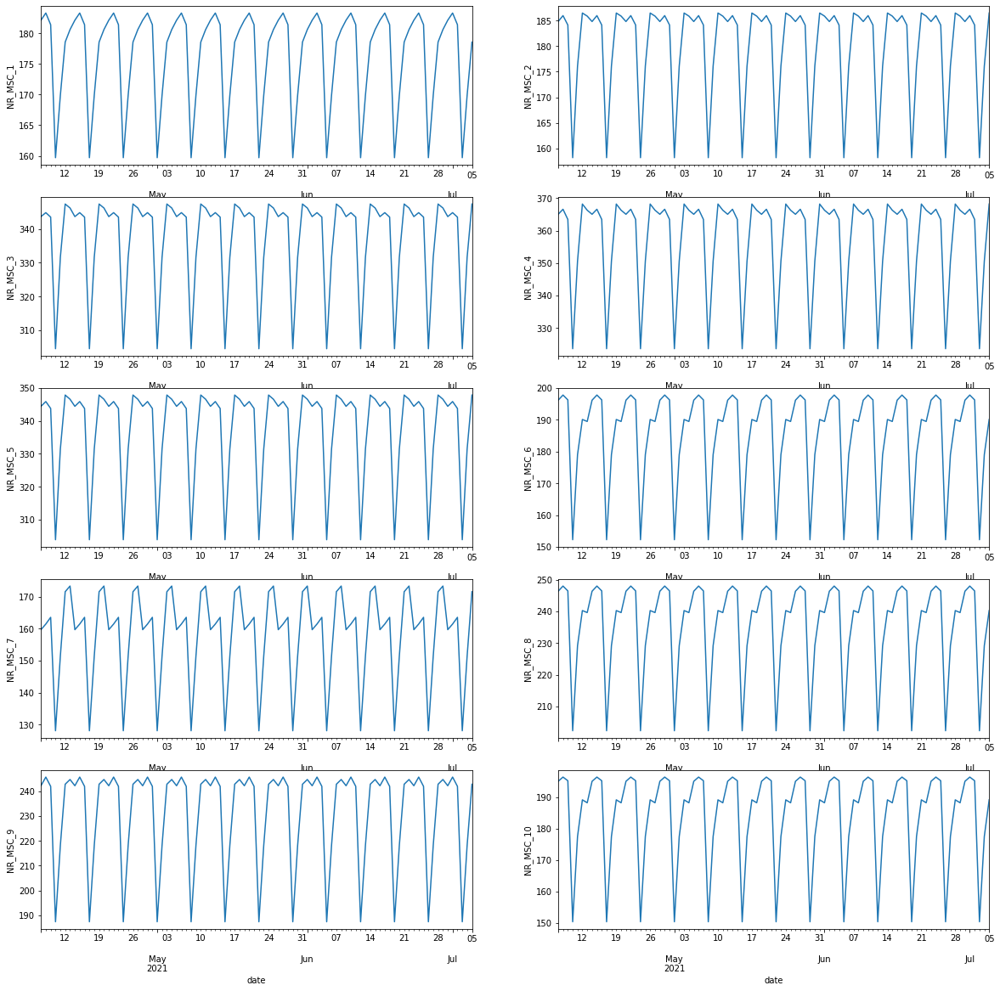

In [ ]:
plot_forecasts(f15d)

### One Month forecast

In [ ]:
f1m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,182.130531,184.808104,343.680009,365.055399,344.386870,196.182314,159.681492,246.345858,242.178303,195.092311
2021-04-08,183.303874,185.963411,344.846986,366.599654,345.830229,197.808847,161.443195,247.979630,245.665785,196.440073
2021-04-09,181.399882,184.123308,343.527707,363.458102,343.736038,196.273717,163.540584,246.446201,241.926142,195.273103
2021-04-10,159.702571,158.180567,304.514279,323.621173,303.936519,152.234057,128.102824,202.373714,187.430480,150.426719
2021-04-11,169.872364,176.094842,331.608637,350.607719,331.415313,179.046474,151.421780,229.196739,218.144473,177.539339


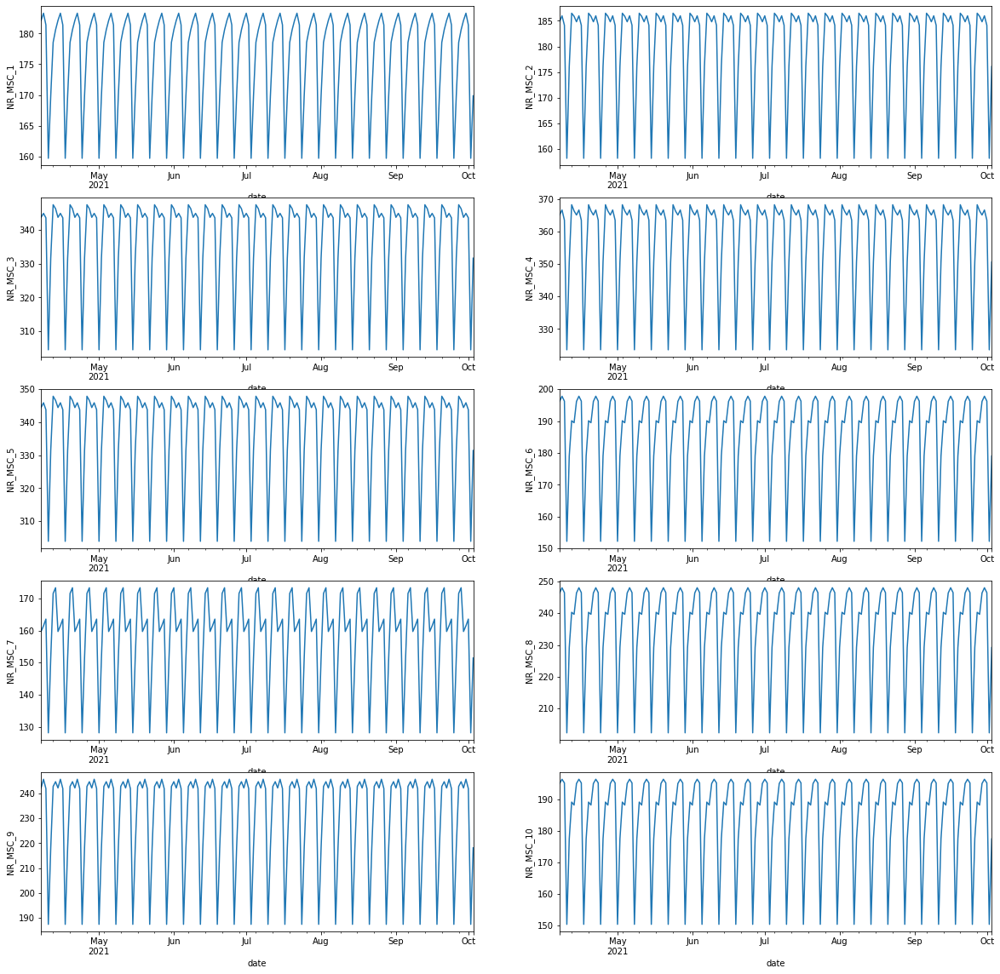

In [ ]:
plot_forecasts(f1m)

### Three Month Forecast

In [ ]:
f3m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,182.130531,184.808104,343.680009,365.055399,344.386870,196.182314,159.681492,246.345858,242.178303,195.092311
2021-04-08,183.303874,185.963411,344.846986,366.599654,345.830229,197.808847,161.443195,247.979630,245.665785,196.440073
2021-04-09,181.399882,184.123308,343.527707,363.458102,343.736038,196.273717,163.540584,246.446201,241.926142,195.273103
2021-04-10,159.702571,158.180567,304.514279,323.621173,303.936519,152.234057,128.102824,202.373714,187.430480,150.426719
2021-04-11,169.872364,176.094842,331.608637,350.607719,331.415313,179.046474,151.421780,229.196739,218.144473,177.539339


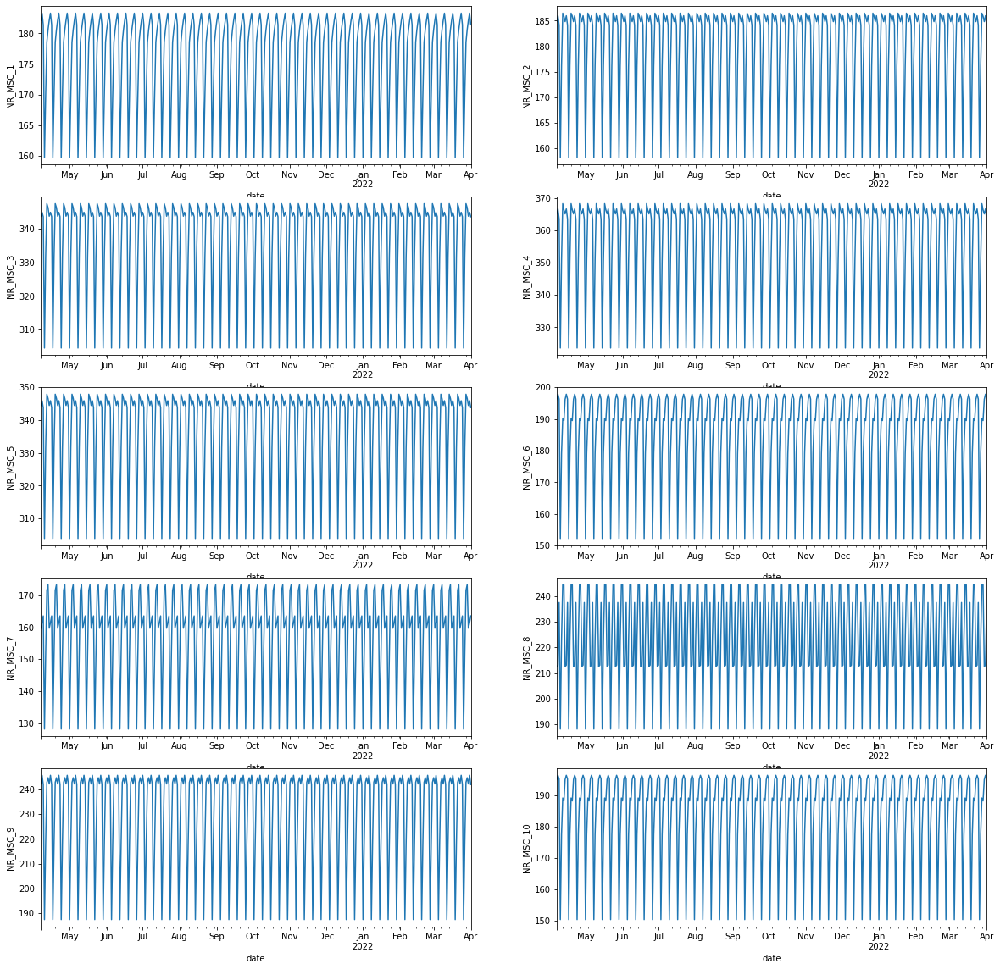

In [ ]:
plot_forecasts(f3m)

# XGBoost

In [46]:
from xgboost import XGBRegressor

In [47]:
def train_test_split(data, n_test):
    return data[:-n_test], data[n_test:]

In [48]:
# transform timeseries dataset into a supervised learning dataset
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    #n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = pd.concat(cols, axis=1)
    # drop rows with nan values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

In [49]:
def train_test_split(data, n_test):
    return data[:-n_test], data[-n_test:, :]

In [50]:
def xgb_forecast(data, model, period):
    for col in data.columns:
        curr_data = data[col]
        predictions = []
        curr_value = []
        for p in range(0, period):
            if p == 0:
                curr_val = [curr_data[-1:]] 
            future = model.predict((curr_val))
            predictions.append(future[0])
            curr_val.clear()
            curr_val.append(future)
            #print(predictions)
        return predictions

In [58]:
def plothist(train, test, predicted):
    fig = plt.figure(figsize=(15, 4))
    fig.suptitle("Train, Test, and Forecast plots")
    past, = plt.plot(train.index, train.values, 'r.-', label="Train")
    future, = plt.plot(test.index, test.values, color ='blue', label="Test")
    predicted_future, = plt.plot(test.index, predicted, 'g.-', label="Predicted")
    plt.legend()
    print(len(train), len(test), len(predicted))
    plt.show()

In [53]:
# fit an xgboost model and make a one step prediction
def xgboost_model(train, testX):
    # transfor list into  array
    train = np.asarray(train)
    # split into input and output colums
    trainX, trainy = train[:, :-1], train[:, -1]
    # fit model
    model = XGBRegressor(objective='reg:squarederror', n_estimators=1000)
    model.fit(trainX, trainy)
    yhat = model.predict([testX])
    #print("Test val : ", testX)
    #print("Predicted : ", yhat)
    return yhat[0], model

In [54]:
def walk_forward_validation(data, n_test):
    forecast_15days, forecast_1Month, forecast_3Months = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
    for i in data.columns:
        print("Fitting ", i)
        curr_data = data[i]
        curr_series = series_to_supervised(curr_data.values)
        #print("series", curr_data)
        predictions = list()
        train, test = train_test_split(curr_series, n_test)
        ##
        history = [x for x in train]
        for k in range(len(test)):
            testX, testy = test[k, :1], test[k, -1]
            # fit model on history and make a prediction
            yhat, model = xgboost_model(history, testX)
            # store forecast in list of predictions
            predictions.append(yhat)
            # add actual observation to history for the next loop
            history.append(test[k])
            #print(f"TestX : {testX} testy: {testy} pred {yhat}")
            
        
        mae = mean_absolute_error(test[:, -1], predictions)
        mape = mean_absolute_percentage_error(test[:, -1], predictions)
        mse = mean_squared_error(test[:, -1], predictions)
        rmse = np.sqrt(mse)
        print("MAE  : ", mae)
        print("MAPE : ", mape)
        print("MSE  : ", mse)
        print("RMSE : ", rmse)
        
        plothist(curr_data[:-70], curr_data[-70:], predictions)
        
        # forecast
        forecast_15days[i] = xgb_forecast(data, model, (15+70))
        forecast_1Month[i] = xgb_forecast(data, model, (30+70))
        forecast_3Months[i] = xgb_forecast(data, model, (90+70))
        
    forecast_15days = forecast_15days.iloc[70:]
    forecast_1Month = forecast_1Month.iloc[70:]
    forecast_3Months = forecast_3Months.iloc[70:]
        
    forecast_15days["Date"] = pd.date_range(start= '2021-04-07', periods=15, freq='1D')
    forecast_15days = forecast_15days.set_index("Date")
    forecast_1Month["Date"] = pd.date_range(start= '2021-04-07', periods=30, freq='1D')
    forecast_1Month = forecast_1Month.set_index("Date")
    forecast_3Months["Date"] = pd.date_range(start= '2021-04-07', periods=90, freq='1D')
    forecast_3Months = forecast_3Months.set_index("Date")
        
    return forecast_15days, forecast_1Month, forecast_3Months

Fitting  NR_MSC_1
MAE  :  125.62333656877789
MAPE :  0.6993286891928903
MSE  :  15892.82015519339
RMSE :  126.06672897792419
300 70 70


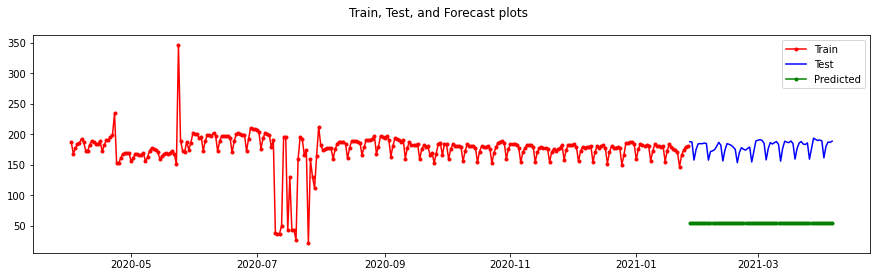

Fitting  NR_MSC_2
MAE  :  125.42589650660923
MAPE :  0.694991564226003
MSE  :  15843.48738502281
RMSE :  125.87091556440991
300 70 70


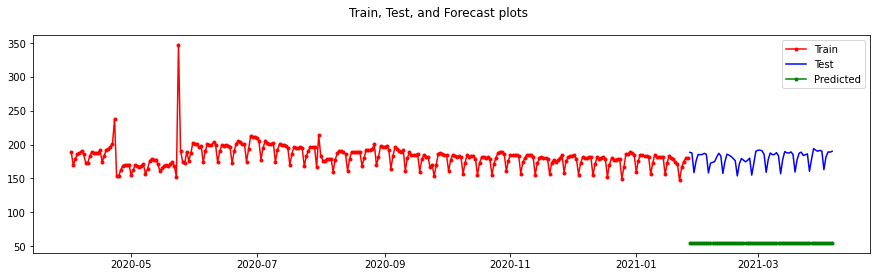

KeyboardInterrupt: 

In [59]:
f15d, f1m, f3m = walk_forward_validation(data, 70)

In [ ]:
f15d.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,179.113998,181.135925,337.918915,360.038879,335.686584,183.136871,188.905594,248.585266,185.140839,120.329803
2021-04-08,177.516357,182.366348,331.061432,333.841522,308.267578,179.162720,188.905594,247.886230,201.336136,69.636353
2021-04-09,155.747620,180.041916,340.638397,360.038879,334.242798,180.721603,188.905594,212.984726,205.109695,143.538071
2021-04-10,173.689224,181.135925,337.918915,333.841522,337.728943,144.044037,188.905594,228.822174,144.356018,168.947128
2021-04-11,179.113998,182.366348,331.061432,360.038879,303.879639,169.796677,188.905594,230.738464,160.813248,179.546310


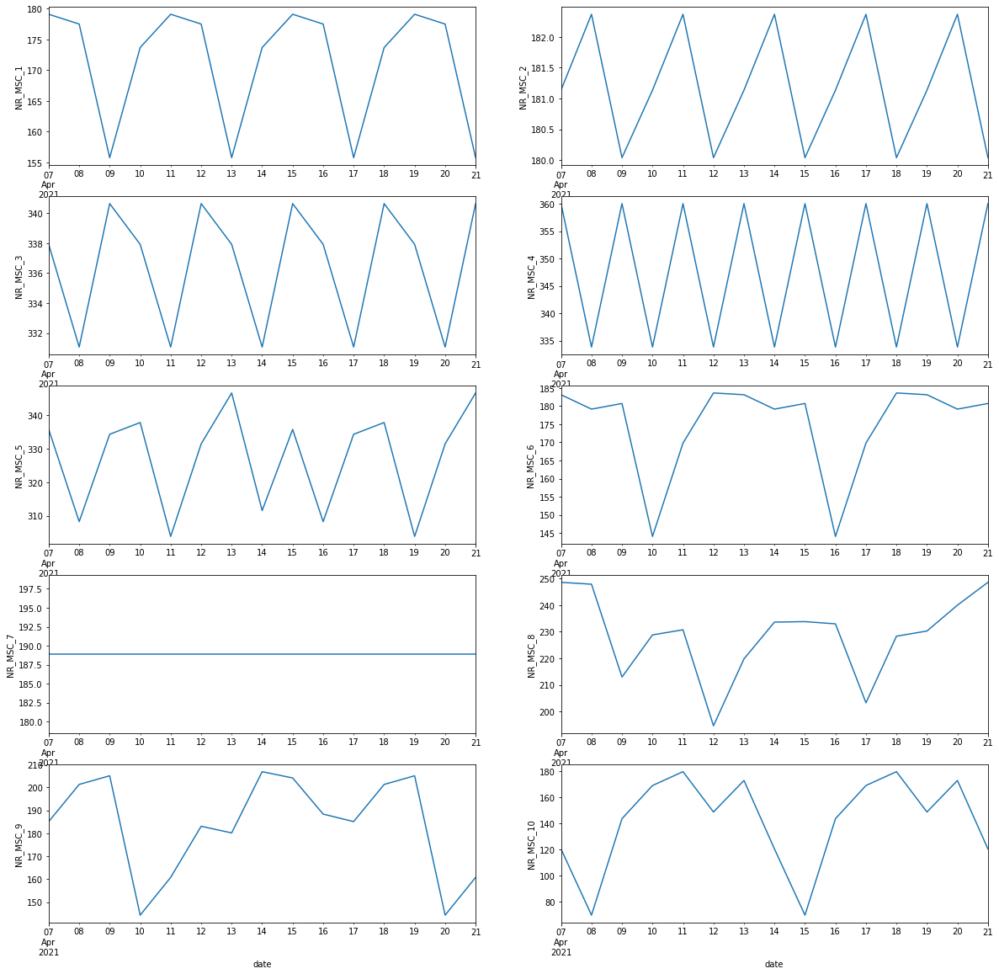

In [ ]:
plot_forecasts(f15d)

In [ ]:
f1m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,179.113998,181.135925,337.918915,360.038879,335.686584,183.136871,188.905594,248.585266,185.140839,120.329803
2021-04-08,177.516357,182.366348,331.061432,333.841522,308.267578,179.162720,188.905594,247.886230,201.336136,69.636353
2021-04-09,155.747620,180.041916,340.638397,360.038879,334.242798,180.721603,188.905594,212.984726,205.109695,143.538071
2021-04-10,173.689224,181.135925,337.918915,333.841522,337.728943,144.044037,188.905594,228.822174,144.356018,168.947128
2021-04-11,179.113998,182.366348,331.061432,360.038879,303.879639,169.796677,188.905594,230.738464,160.813248,179.546310


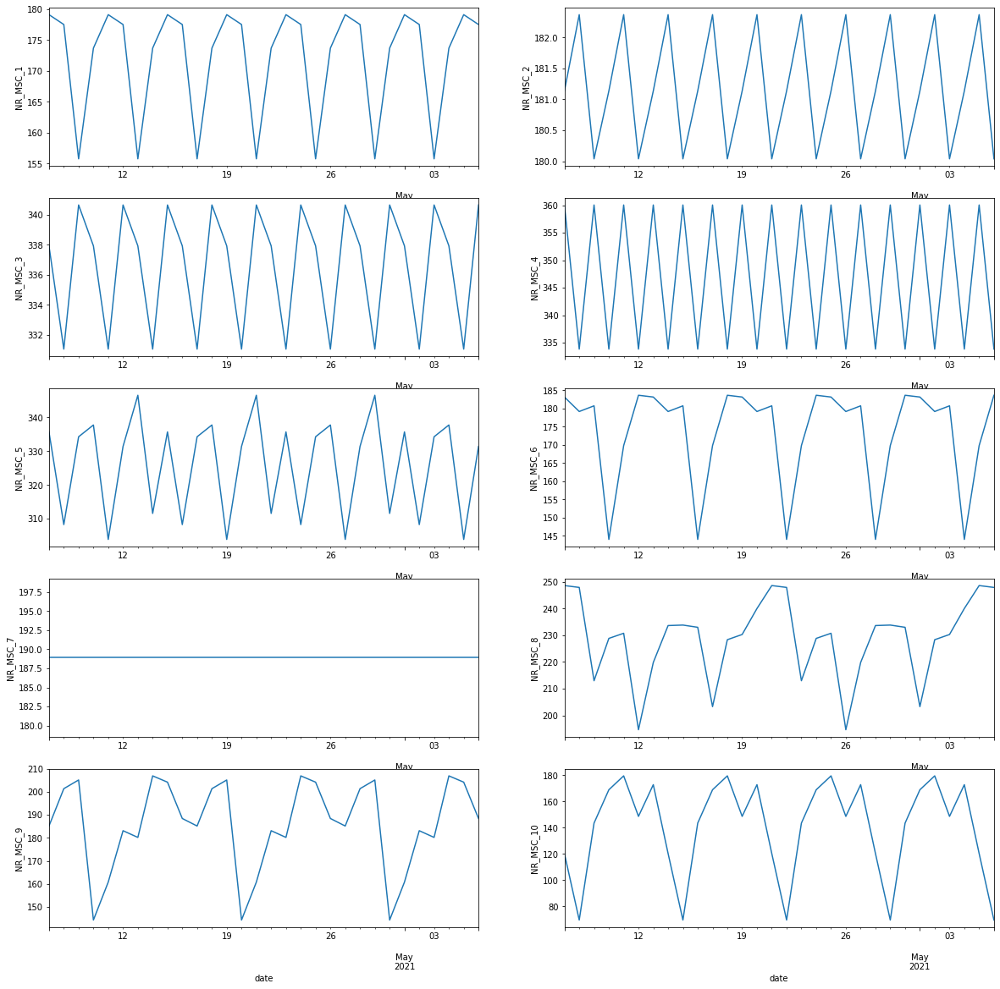

In [ ]:
plot_forecasts(f1m)

In [ ]:
f3m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,179.113998,181.135925,337.918915,360.038879,335.686584,183.136871,188.905594,248.585266,185.140839,120.329803
2021-04-08,177.516357,182.366348,331.061432,333.841522,308.267578,179.162720,188.905594,247.886230,201.336136,69.636353
2021-04-09,155.747620,180.041916,340.638397,360.038879,334.242798,180.721603,188.905594,212.984726,205.109695,143.538071
2021-04-10,173.689224,181.135925,337.918915,333.841522,337.728943,144.044037,188.905594,228.822174,144.356018,168.947128
2021-04-11,179.113998,182.366348,331.061432,360.038879,303.879639,169.796677,188.905594,230.738464,160.813248,179.546310


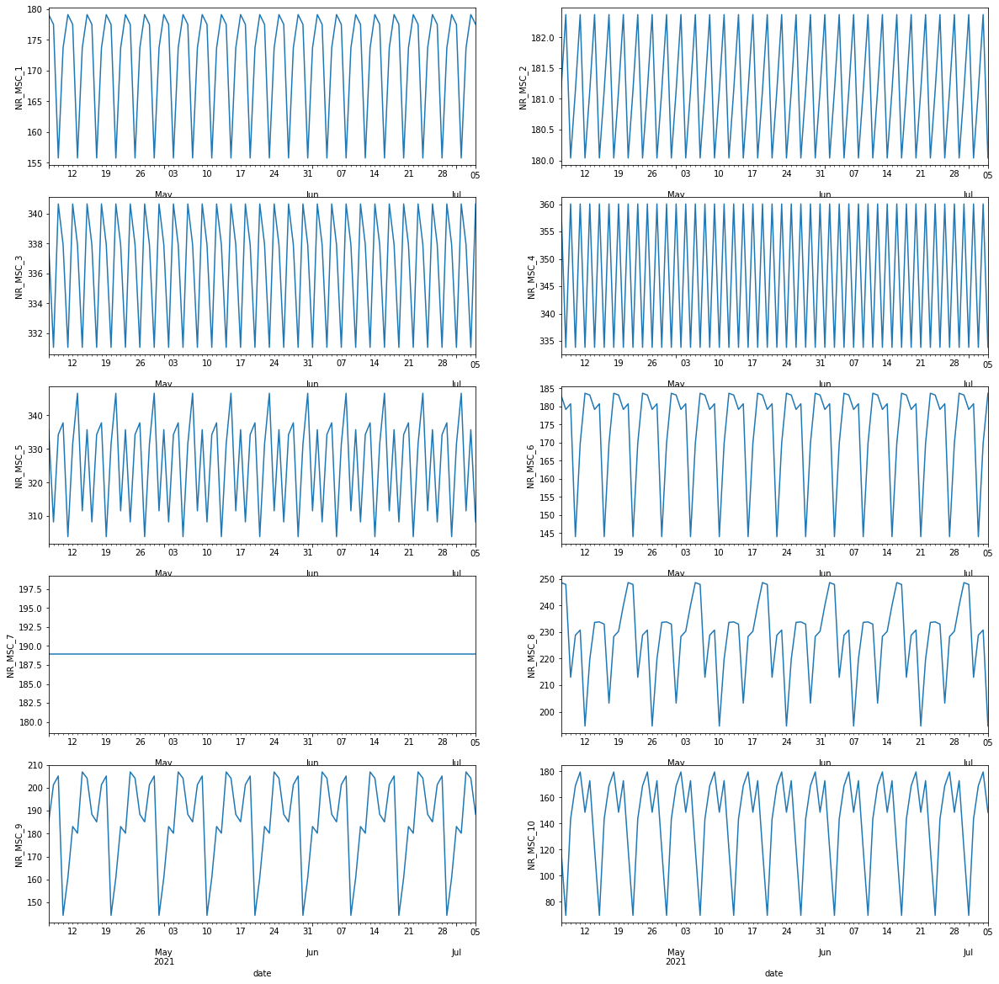

In [ ]:
plot_forecasts(f3m)

# PROPHET

In [ ]:
from fbprophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

In [ ]:
data.tail()

MSC_Id,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
2021-04-02,161.253,162.989,309.678,333.392,307.955,152.999,138.468,202.999,194.302,153.917
2021-04-03,180.222,181.657,337.292,362.338,335.767,177.654,162.496,227.654,228.045,179.374
2021-04-04,187.117,189.028,346.482,372.988,346.150,191.455,176.671,241.455,246.853,192.928
2021-04-05,186.749,188.786,345.958,371.412,345.946,191.824,177.180,241.824,248.553,193.073
2021-04-06,188.622,190.014,347.386,372.678,347.595,193.856,179.343,243.856,250.718,194.612


In [ ]:
def plot_hist(train, test, predicted):
    fig = plt.figure(figsize=(15, 4))
    fig.suptitle("Train, Test, and Forecast plots")
    past, = plt.plot(train.index, train['y'], 'r.-', label="Train")
    future, = plt.plot(test.index, test['y'], color ='blue', label="Test")
    predicted_future, = plt.plot(test.index, predicted, 'g.-', label="Predicted")
    plt.legend()
    plt.show()

In [ ]:
def prophet_forecast(model, start_date, period):
    dates = pd.date_range(start_date, periods=period)
    future = pd.DataFrame(dates)
    future.columns = ['ds']
    future['ds'] = pd.to_datetime(future['ds'])
    preds = model.predict(future)
    return preds['yhat']

In [ ]:
def model(start_date):
    forecast_15days, forecast_1Month, forecast_3Months = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
    for i in data.columns:
        print(i)
        df = pd.DataFrame()
        df['ds'] = data.index
        df['index'] = data.index
        df = df.set_index('index')
        df['y'] = data[i].values
        df['ds'] = pd.to_datetime(df['ds'])
        train, test = df[:300], df[300:]
#         print(train.shape)
#         print(test.shape)
        model = Prophet(daily_seasonality=True, yearly_seasonality=False)
        model.fit(train)
        
        # validation
        y_pred = model.predict(test)['yhat']
        mae = mean_absolute_error(test['y'], y_pred)
        mape = mean_absolute_percentage_error(test['y'], y_pred)
        mse = mean_squared_error(test['y'], y_pred)
        rmse = np.sqrt(mse)
        print("MAE  : ", mae)
        print("MAPE : ", mape)
        print("MSE  : ", mse)
        print("RMSE : ", rmse)
        
        
        # forecast
        plot_hist(train, test, y_pred)
        
        forecast_15days[i] = prophet_forecast(model,start_date, (15+70))
        forecast_1Month[i] = prophet_forecast(model,start_date, (30+70))
        forecast_3Months[i] = prophet_forecast(model,start_date, (90+70))
        
        
    forecast_15days = forecast_15days.iloc[70:]
    forecast_1Month = forecast_1Month.iloc[70:]
    forecast_3Months = forecast_3Months.iloc[70:]
        
    forecast_15days["Date"] = pd.date_range(start= '2021-04-07', periods=15, freq='1D')
    forecast_15days = forecast_15days.set_index("Date")
    forecast_1Month["Date"] = pd.date_range(start= '2021-04-07', periods=30, freq='1D')
    forecast_1Month = forecast_1Month.set_index("Date")
    forecast_3Months["Date"] = pd.date_range(start= '2021-04-07', periods=90, freq='1D')
    forecast_3Months = forecast_3Months.set_index("Date")
        
    return forecast_15days, forecast_1Month, forecast_3Months

NR_MSC_1
MAE  :  5.662492833255455
MAPE :  0.030959453923748003
MSE  :  45.41828766493501
RMSE :  6.739309138549367


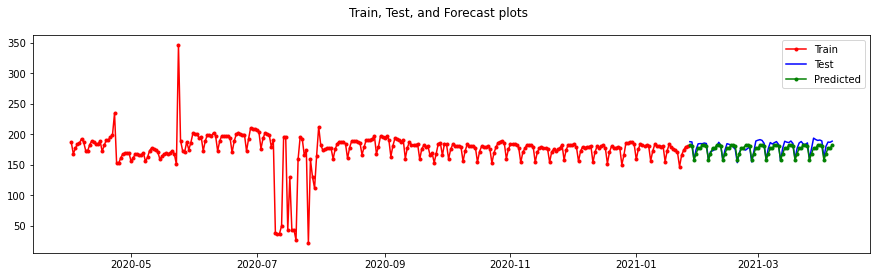

NR_MSC_2
MAE  :  8.991682602928442
MAPE :  0.04910997098904806
MSE  :  103.02054560390336
RMSE :  10.149903723873608


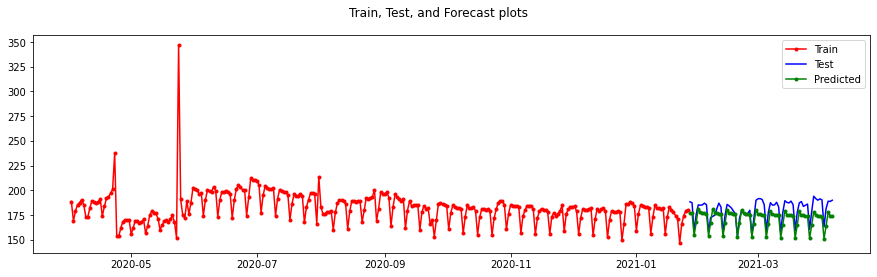

NR_MSC_3
MAE  :  10.156138831691147
MAPE :  0.029880095819760224
MSE  :  142.21082039561028
RMSE :  11.92521783430434


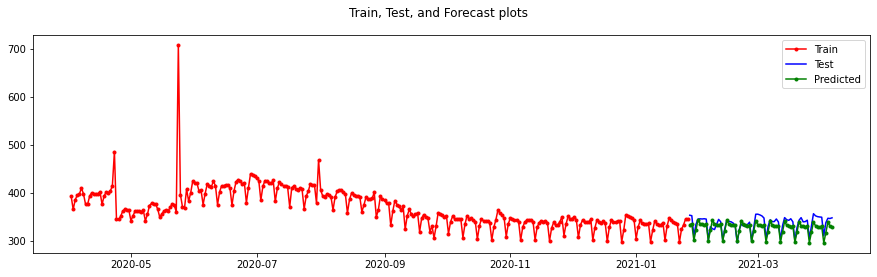

NR_MSC_4
MAE  :  19.433594598826648
MAPE :  0.05398748508998368
MSE  :  455.80619367308617
RMSE :  21.34961811539228


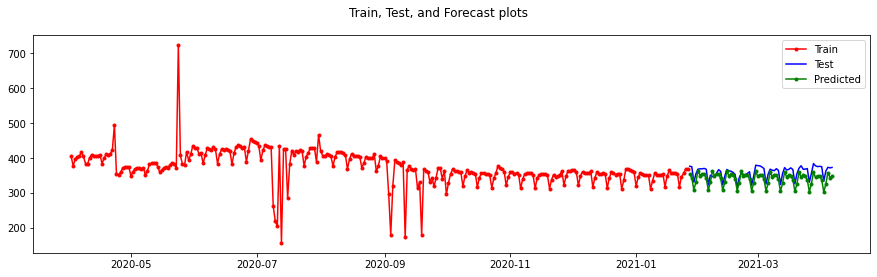

NR_MSC_5
MAE  :  12.79894019500884
MAPE :  0.03769864313537457
MSE  :  213.41267354106557
RMSE :  14.608650640667179


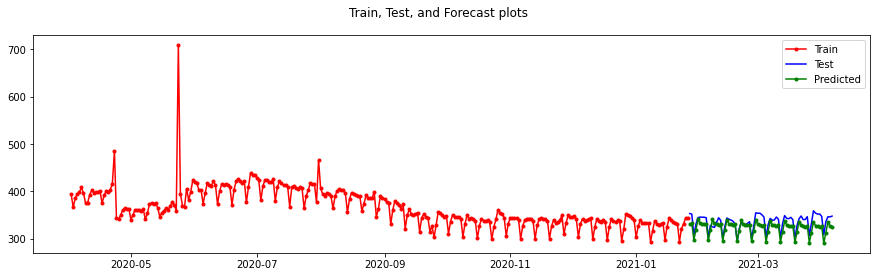

NR_MSC_6
MAE  :  19.83542739864952
MAPE :  0.09577614994631047
MSE  :  956.1819399738966
RMSE :  30.922191707152592


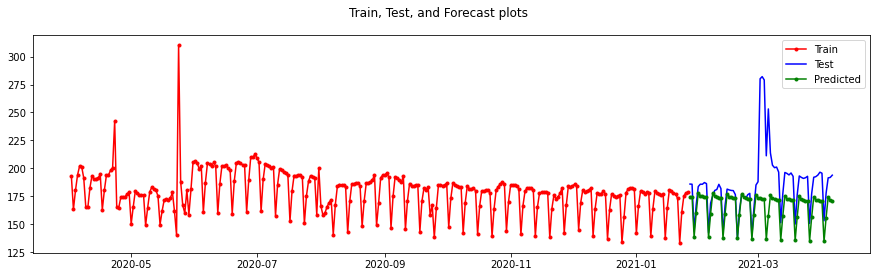

NR_MSC_7
MAE  :  8.228622744950968
MAPE :  0.05321848976697073
MSE  :  152.9889653135968
RMSE :  12.368870818049512


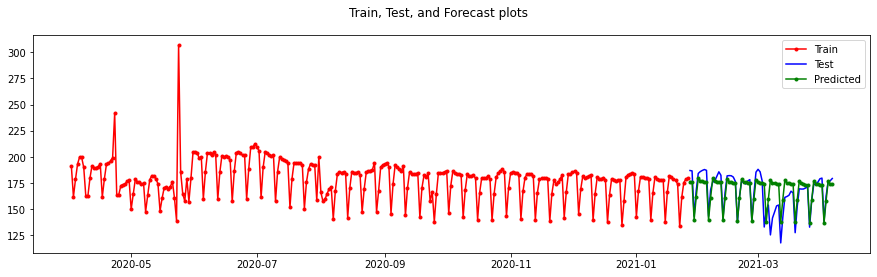

NR_MSC_8
MAE  :  19.83585961113795
MAPE :  0.07676088927995947
MSE  :  955.9459072430159
RMSE :  30.918374912711954


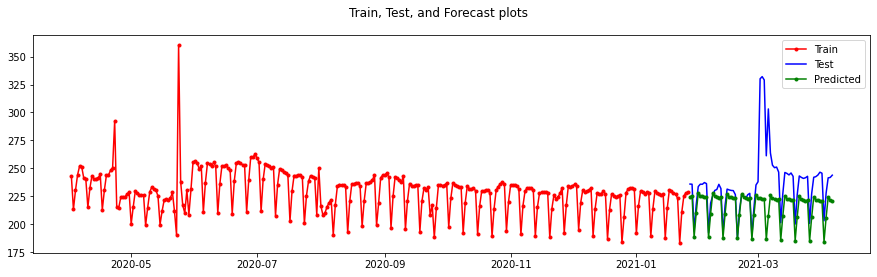

NR_MSC_9
MAE  :  18.528694458315897
MAPE :  0.08906778457145258
MSE  :  523.707476348411
RMSE :  22.884655915010192


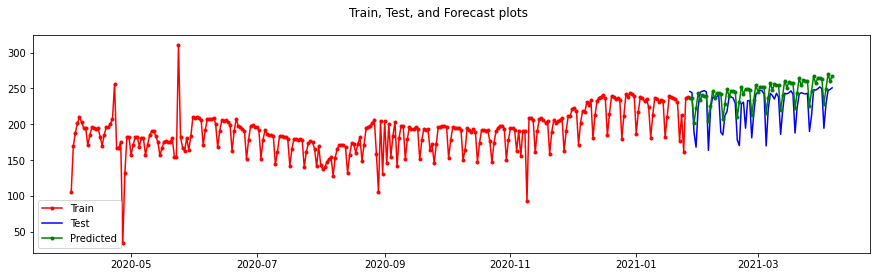

NR_MSC_10
MAE  :  14.347806586667458
MAPE :  0.06625750991317896
MSE  :  737.061862142193
RMSE :  27.148883257736276


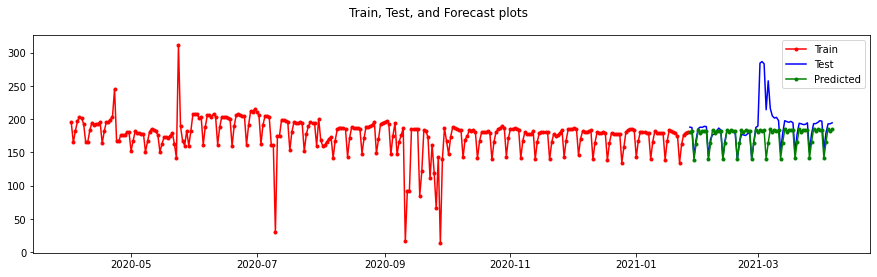

In [ ]:
f15d, f1m, f3m = model('2021-04-06')

# 15 Days Forecast

In [ ]:
f15d.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,182.208529,170.084238,322.800209,341.885325,318.051849,166.503659,170.080776,216.363853,297.487257,187.506334
2021-04-08,182.436674,169.598219,321.468826,340.997857,316.725195,165.621935,169.265468,215.486002,296.865732,186.494814
2021-04-09,180.571244,169.250207,322.894631,329.490324,317.814509,165.679030,169.224562,216.107451,296.382251,187.087543
2021-04-10,158.048787,146.784635,288.837161,295.450231,283.098715,129.618455,132.885865,179.461374,261.228084,144.481421
2021-04-11,168.104007,160.010601,309.816585,318.267364,304.365404,150.885193,154.232187,200.732469,282.224857,168.489002


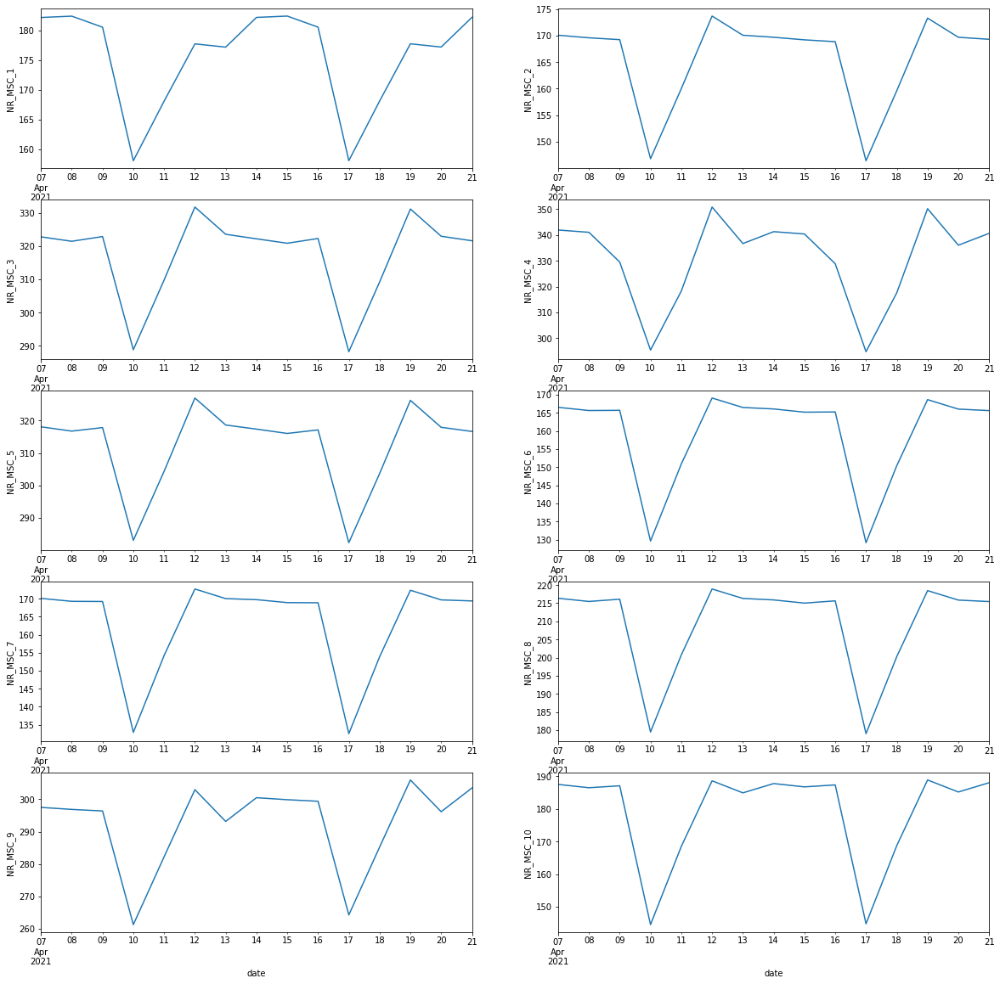

In [ ]:
plot_forecasts(f15d)

# One Month Forecast

In [ ]:
f1m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,182.208529,170.084238,322.800209,341.885325,318.051849,166.503659,170.080776,216.363853,297.487257,187.506334
2021-04-08,182.436674,169.598219,321.468826,340.997857,316.725195,165.621935,169.265468,215.486002,296.865732,186.494814
2021-04-09,180.571244,169.250207,322.894631,329.490324,317.814509,165.679030,169.224562,216.107451,296.382251,187.087543
2021-04-10,158.048787,146.784635,288.837161,295.450231,283.098715,129.618455,132.885865,179.461374,261.228084,144.481421
2021-04-11,168.104007,160.010601,309.816585,318.267364,304.365404,150.885193,154.232187,200.732469,282.224857,168.489002


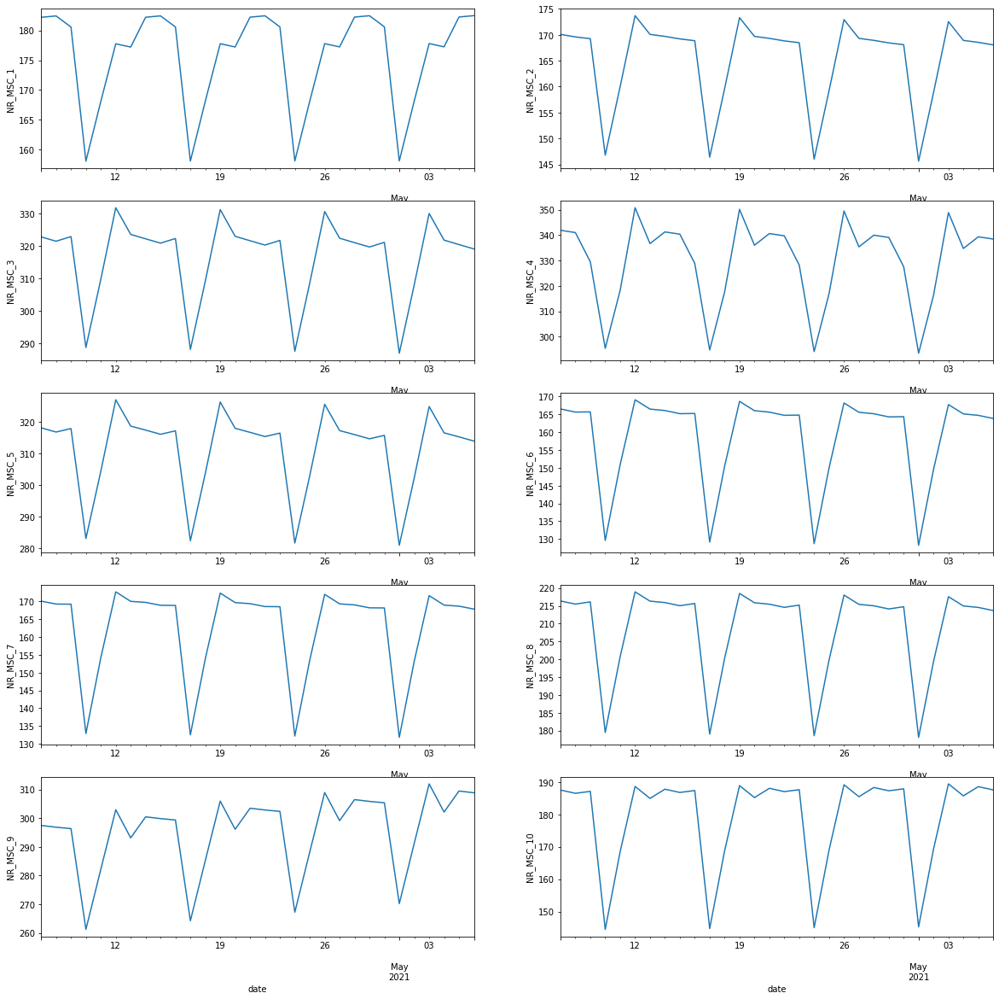

In [ ]:
plot_forecasts(f1m)

# Three Month Forecast

In [ ]:
f3m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,182.208529,170.084238,322.800209,341.885325,318.051849,166.503659,170.080776,216.363853,297.487257,187.506334
2021-04-08,182.436674,169.598219,321.468826,340.997857,316.725195,165.621935,169.265468,215.486002,296.865732,186.494814
2021-04-09,180.571244,169.250207,322.894631,329.490324,317.814509,165.679030,169.224562,216.107451,296.382251,187.087543
2021-04-10,158.048787,146.784635,288.837161,295.450231,283.098715,129.618455,132.885865,179.461374,261.228084,144.481421
2021-04-11,168.104007,160.010601,309.816585,318.267364,304.365404,150.885193,154.232187,200.732469,282.224857,168.489002


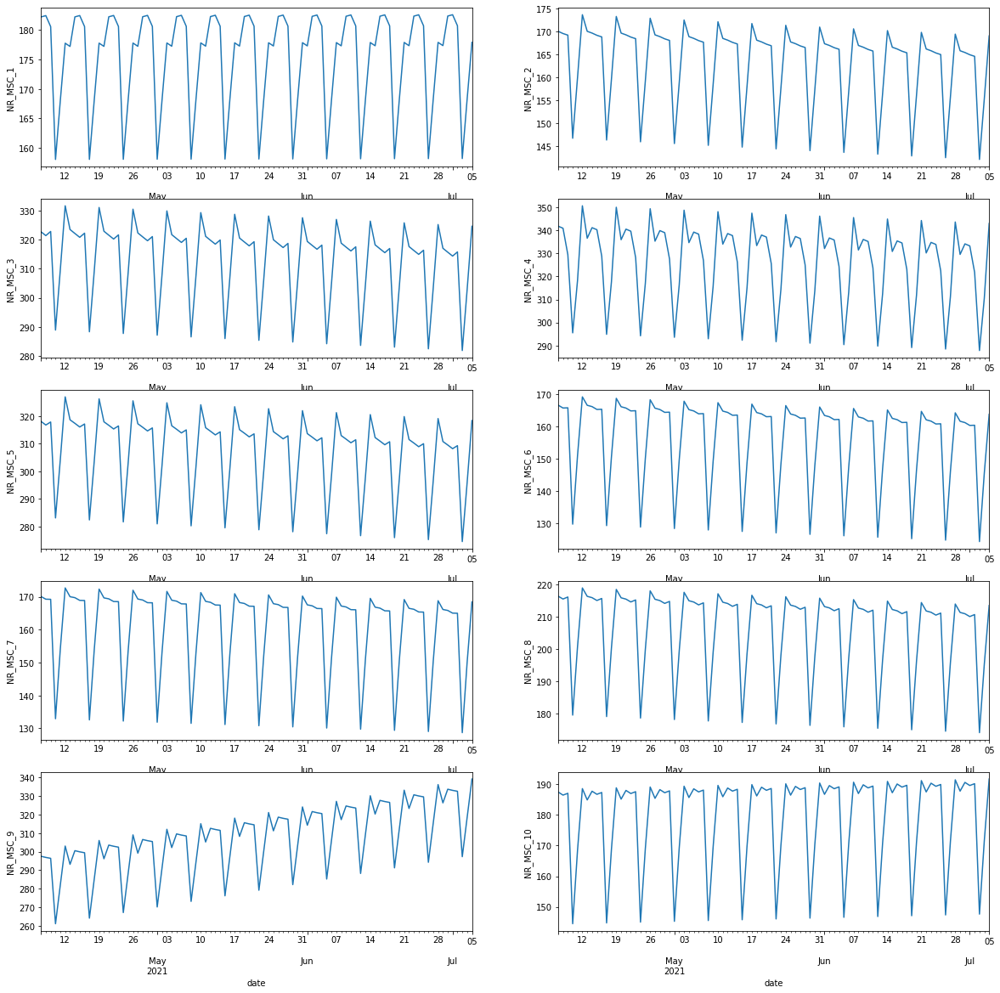

In [ ]:
plot_forecasts(f3m)

# LSTM

In [ ]:
n_past = 14
n_future = 10
n_features = 1

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

In [ ]:
cols = data.columns
dt = pd.DataFrame(scaler.fit_transform(data))
dt.columns = cols
dt.index = data.index

In [ ]:
dt.head()

MSC_Id,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
2020-04-02,0.509794,0.209457,0.237154,0.438340,0.243119,0.337439,0.387776,0.337439,0.260006,0.610539
2020-04-03,0.450955,0.111292,0.169907,0.390284,0.174894,0.170163,0.233382,0.170163,0.488726,0.508397
2020-04-04,0.478452,0.160966,0.218479,0.423447,0.221531,0.265829,0.321434,0.265829,0.557572,0.566126
2020-04-05,0.500684,0.193480,0.241465,0.436113,0.242196,0.343853,0.398780,0.343853,0.604424,0.615059
2020-04-06,0.505322,0.203914,0.246133,0.438448,0.250238,0.389284,0.435011,0.389284,0.637924,0.638543


In [ ]:
def split(data, split_idx):
    train, test = data.iloc[:split_idx], data.iloc[split_idx:]
    return train, test

In [ ]:
def split_series(series, n_past, n_future):
    series = np.array(series).reshape(-1, 1)
    X, y = list(), list()
    for window_start in range(len(series)):
        past_end = window_start + n_past
        future_end = past_end + n_future
        if future_end > len(series):
            break
            
        # slicing the past and future parts of the window
        past, future = series[window_start:past_end, :], series[past_end:future_end, :]
        X.append(past)
        y.append(future)
    return np.array(X), np.array(y)

In [ ]:
def train_set_preprocess(train_set, n_past, n_future):
    X_train, y_train = split_series(train_set.values, n_past, n_future)
    X_train = X_train.reshape((X_train.shape[0], n_past, n_features))
    y_train = y_train.reshape((X_train.shape[0], n_future, n_features))
    return X_train, y_train
def test_set_preprocess(test_set, n_past, n_future):
    X_test, y_test = split_series(test_set.values, n_past, n_future)
    X_test = X_test.reshape((X_test.shape[0], n_past, n_features))
    y_test = y_test.reshape((X_test.shape[0], n_future, n_features))
    return X_test, y_test

In [ ]:
import keras.backend as k
k.clear_session()

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Input, Bidirectional, Dropout

def create_model(n_past, n_features):
    model = Sequential()
    model.add(Input(shape=(n_past, n_features)))
    model.add(LSTM(360, activation='relu', return_sequences=True))
    model.add(LSTM(30, activation='relu', return_sequences=False))
    model.add(Dense(n_future, activation='linear'))
    return model

In [ ]:
model = create_model(n_past, n_features)
model.summary()

# model =bilstm_model(64)
# model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 14, 360)           521280    
                                                                 
 lstm_1 (LSTM)               (None, 30)                46920     
                                                                 
 dense (Dense)               (None, 10)                310       
                                                                 
Total params: 568,510
Trainable params: 568,510
Non-trainable params: 0
_________________________________________________________________


In [ ]:
def forecast(data, model, period):
    for col in data.columns:
        curr_data = data[col]
        past_10_hist = list(curr_data[-14:])
        predictions = []
        for p in range(0, period):
            past_10 = np.array(past_10_hist).reshape(1, 14, 1)
        
            #print(past_10)
            [future] = model.predict(past_10)
            future = future[0]
            predictions.append(future)
            #print("Future : ", future[0])
            past_10_hist.pop(0)
            past_10_hist.append(future)
        return predictions

In [ ]:
def plot(train, test, y_test, predicted):
    fig = plt.figure(figsize=(15, 4))
    fig.suptitle("Train, Test, and Forecast plots")
    past, = plt.plot(train.index, train, 'r.-', label="Train")
    future, = plt.plot(test.index[-70:], y_test[-70:], color ='blue', label="Test")
    predicted_future, = plt.plot(test.index[-70:], predicted[-70:], 'g.-', label="Predicted")
    plt.legend()
    plt.show()

In [ ]:
def models(data, split_idx):
    forecast_15days, forecast_1Month, forecast_3Months = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
    for i in range(0, len(data.columns)):
        warnings.resetwarnings()
        warnings.filterwarnings('ignore')
        tf.keras.backend.clear_session()
        curr_data = data[data.columns[i]]
        print("Fitting ", data.columns[i])
        train, test = split(curr_data, split_idx)
        X_train, y_train = train_set_preprocess(train, n_past, n_future)
        X_test, y_test = test_set_preprocess(test, n_past, n_future)
        
        #reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)

        model.compile(optimizer='adam', loss='mse')
        history=model.fit(X_train,y_train,epochs=20, batch_size=30,verbose=1)
        
        # validation
        y_pred = model.predict(X_test)
        mae = mean_absolute_error(y_test.reshape(-1, 1), y_pred.reshape(-1, 1))
        mape = mean_absolute_percentage_error(y_test.reshape(-1, 1), y_pred.reshape(-1, 1))
        mse = mean_squared_error(y_test.reshape(-1, 1), y_pred.reshape(-1, 1))
        rmse = np.sqrt(mse)
        print("MAE  : ", mae)
        print("MAPE : ", mape)
        print("MSE  : ", mse)
        print("RMSE : ", rmse)
        
        plot(train, test, y_test.reshape(-1, 1), y_pred.reshape(-1, 1))
        
        # Forecast
       
        forecast_15days[data.columns[i]] = forecast(data, model, (15+70))
        forecast_1Month[data.columns[i]] = forecast(data, model, (30+70))
        forecast_3Months[data.columns[i]] = forecast(data, model, (90+70))
        
    forecast_15days = forecast_15days.iloc[70:]
    forecast_1Month = forecast_1Month.iloc[70:]
    forecast_3Months = forecast_3Months.iloc[70:]
        
    forecast_15days["Date"] = pd.date_range(start= '2021-04-07', periods=15, freq='1D')
    forecast_15days = forecast_15days.set_index("Date")
    forecast_1Month["Date"] = pd.date_range(start= '2021-04-07', periods=30, freq='1D')
    forecast_1Month = forecast_1Month.set_index("Date")
    forecast_3Months["Date"] = pd.date_range(start= '2021-04-07', periods=90, freq='1D')
    forecast_3Months = forecast_3Months.set_index("Date")
        
    return forecast_15days, forecast_1Month, forecast_3Months

### Fitting daily data

Fitting  NR_MSC_1
Epoch 1/20
10/10 [==============================] - 3s 71ms/step - loss: 2829.8066
Epoch 2/20
10/10 [==============================] - 1s 70ms/step - loss: 1249.6611
Epoch 3/20
10/10 [==============================] - 1s 69ms/step - loss: 1018.9334
Epoch 4/20
10/10 [==============================] - 1s 75ms/step - loss: 953.5774
Epoch 5/20
10/10 [==============================] - 1s 69ms/step - loss: 922.0049
Epoch 6/20
10/10 [==============================] - 1s 67ms/step - loss: 913.5107
Epoch 7/20
10/10 [==============================] - 1s 67ms/step - loss: 933.7936
Epoch 8/20
10/10 [==============================] - 1s 71ms/step - loss: 938.1304
Epoch 9/20
10/10 [==============================] - 1s 69ms/step - loss: 928.4526
Epoch 10/20
10/10 [==============================] - 1s 66ms/step - loss: 930.7107
Epoch 11/20
10/10 [==============================] - 1s 70ms/step - loss: 947.5899
Epoch 12/20
10/10 [==============================] - 1s 68ms/step - loss: 8

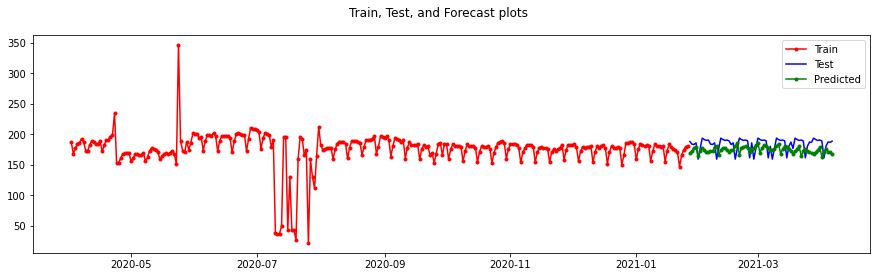

Fitting  NR_MSC_2
Epoch 1/20
10/10 [==============================] - 3s 69ms/step - loss: 2169.0825
Epoch 2/20
10/10 [==============================] - 1s 67ms/step - loss: 616.3934
Epoch 3/20
10/10 [==============================] - 1s 67ms/step - loss: 368.6409
Epoch 4/20
10/10 [==============================] - 1s 70ms/step - loss: 1030.5569
Epoch 5/20
10/10 [==============================] - 1s 67ms/step - loss: 511.9329
Epoch 6/20
10/10 [==============================] - 1s 71ms/step - loss: 390.6551
Epoch 7/20
10/10 [==============================] - 1s 70ms/step - loss: 301.5815
Epoch 8/20
10/10 [==============================] - 1s 70ms/step - loss: 273.6639
Epoch 9/20
10/10 [==============================] - 1s 69ms/step - loss: 265.3015
Epoch 10/20
10/10 [==============================] - 1s 71ms/step - loss: 261.4656
Epoch 11/20
10/10 [==============================] - 1s 70ms/step - loss: 264.2334
Epoch 12/20
10/10 [==============================] - 1s 67ms/step - loss: 25

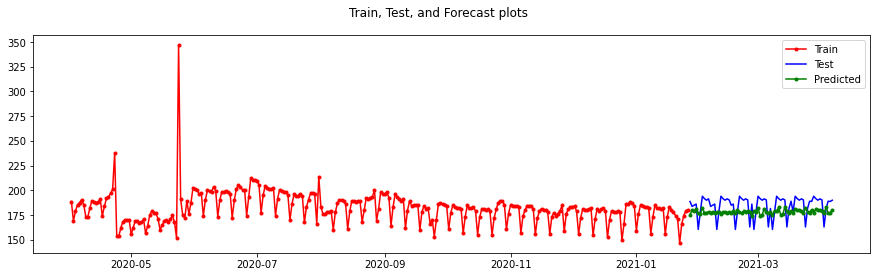

Fitting  NR_MSC_3
Epoch 1/20
10/10 [==============================] - 3s 69ms/step - loss: 2762.4163
Epoch 2/20
10/10 [==============================] - 1s 71ms/step - loss: 1614.3674
Epoch 3/20
10/10 [==============================] - 1s 72ms/step - loss: 972.0626
Epoch 4/20
10/10 [==============================] - 1s 71ms/step - loss: 893.6909
Epoch 5/20
10/10 [==============================] - 1s 70ms/step - loss: 911.9779
Epoch 6/20
10/10 [==============================] - 1s 69ms/step - loss: 891.2816
Epoch 7/20
10/10 [==============================] - 1s 71ms/step - loss: 881.8196
Epoch 8/20
10/10 [==============================] - 1s 71ms/step - loss: 911.1927
Epoch 9/20
10/10 [==============================] - 1s 72ms/step - loss: 919.0620
Epoch 10/20
10/10 [==============================] - 1s 70ms/step - loss: 887.7749
Epoch 11/20
10/10 [==============================] - 1s 69ms/step - loss: 870.5491
Epoch 12/20
10/10 [==============================] - 1s 69ms/step - loss: 89

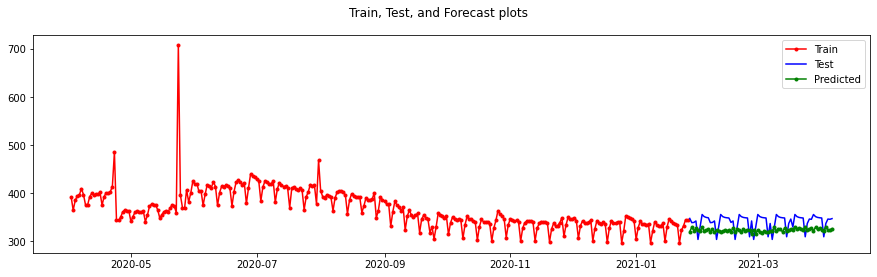

Fitting  NR_MSC_4
Epoch 1/20
10/10 [==============================] - 3s 70ms/step - loss: 5332.2798
Epoch 2/20
10/10 [==============================] - 1s 69ms/step - loss: 3262.6853
Epoch 3/20
10/10 [==============================] - 1s 69ms/step - loss: 3577.5161
Epoch 4/20
10/10 [==============================] - 1s 66ms/step - loss: 2458.3501
Epoch 5/20
10/10 [==============================] - 1s 69ms/step - loss: 2164.7017
Epoch 6/20
10/10 [==============================] - 1s 70ms/step - loss: 2265.9885
Epoch 7/20
10/10 [==============================] - 1s 70ms/step - loss: 2092.0505
Epoch 8/20
10/10 [==============================] - 1s 68ms/step - loss: 2075.8000
Epoch 9/20
10/10 [==============================] - 1s 71ms/step - loss: 2071.3972
Epoch 10/20
10/10 [==============================] - 1s 71ms/step - loss: 2099.1431
Epoch 11/20
10/10 [==============================] - 1s 71ms/step - loss: 2097.4497
Epoch 12/20
10/10 [==============================] - 1s 73ms/step -

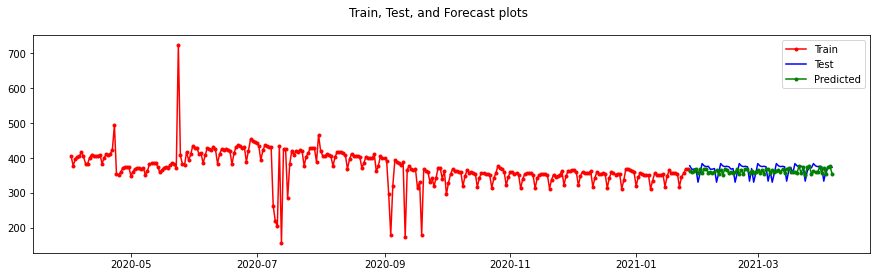

Fitting  NR_MSC_5
Epoch 1/20
10/10 [==============================] - 3s 70ms/step - loss: 2508.9873
Epoch 2/20
10/10 [==============================] - 1s 69ms/step - loss: 1184.9419
Epoch 3/20
10/10 [==============================] - 1s 69ms/step - loss: 1093.7625
Epoch 4/20
10/10 [==============================] - 1s 70ms/step - loss: 937.0377
Epoch 5/20
10/10 [==============================] - 1s 72ms/step - loss: 925.7511
Epoch 6/20
10/10 [==============================] - 1s 73ms/step - loss: 892.6983
Epoch 7/20
10/10 [==============================] - 1s 73ms/step - loss: 892.3408
Epoch 8/20
10/10 [==============================] - 1s 73ms/step - loss: 878.7003
Epoch 9/20
10/10 [==============================] - 1s 73ms/step - loss: 903.1408
Epoch 10/20
10/10 [==============================] - 1s 72ms/step - loss: 896.4146
Epoch 11/20
10/10 [==============================] - 1s 70ms/step - loss: 888.6093
Epoch 12/20
10/10 [==============================] - 1s 74ms/step - loss: 8

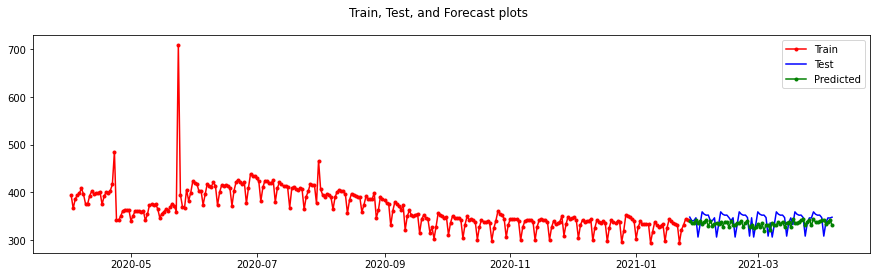

Fitting  NR_MSC_6
Epoch 1/20
10/10 [==============================] - 3s 70ms/step - loss: 950.0311
Epoch 2/20
10/10 [==============================] - 1s 69ms/step - loss: 458.3009
Epoch 3/20
10/10 [==============================] - 1s 73ms/step - loss: 366.3711
Epoch 4/20
10/10 [==============================] - 1s 73ms/step - loss: 343.9284
Epoch 5/20
10/10 [==============================] - 1s 71ms/step - loss: 329.0282
Epoch 6/20
10/10 [==============================] - 1s 76ms/step - loss: 333.3139
Epoch 7/20
10/10 [==============================] - 1s 73ms/step - loss: 321.6091
Epoch 8/20
10/10 [==============================] - 1s 73ms/step - loss: 315.1366
Epoch 9/20
10/10 [==============================] - 1s 73ms/step - loss: 668.5408
Epoch 10/20
10/10 [==============================] - 1s 71ms/step - loss: 3351.3843
Epoch 11/20
10/10 [==============================] - 1s 72ms/step - loss: 975.0327
Epoch 12/20
10/10 [==============================] - 1s 74ms/step - loss: 524

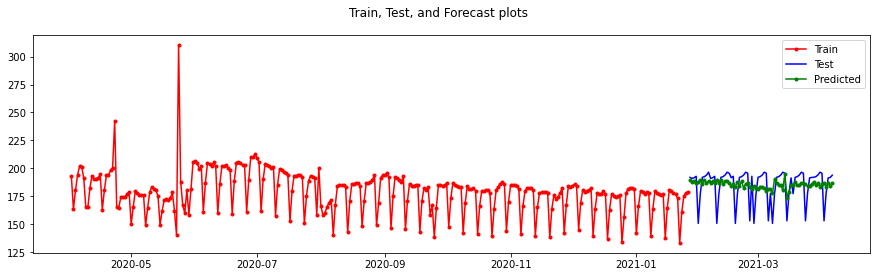

Fitting  NR_MSC_7
Epoch 1/20
10/10 [==============================] - 3s 75ms/step - loss: 617.9838
Epoch 2/20
10/10 [==============================] - 1s 75ms/step - loss: 396.8036
Epoch 3/20
10/10 [==============================] - 1s 74ms/step - loss: 342.2482
Epoch 4/20
10/10 [==============================] - 1s 72ms/step - loss: 329.8276
Epoch 5/20
10/10 [==============================] - 1s 74ms/step - loss: 322.3251
Epoch 6/20
10/10 [==============================] - 1s 69ms/step - loss: 322.6190
Epoch 7/20
10/10 [==============================] - 1s 71ms/step - loss: 334.9867
Epoch 8/20
10/10 [==============================] - 1s 71ms/step - loss: 331.7101
Epoch 9/20
10/10 [==============================] - 1s 70ms/step - loss: 333.1576
Epoch 10/20
10/10 [==============================] - 1s 71ms/step - loss: 312.5589
Epoch 11/20
10/10 [==============================] - 1s 72ms/step - loss: 315.4336
Epoch 12/20
10/10 [==============================] - 1s 74ms/step - loss: 306.

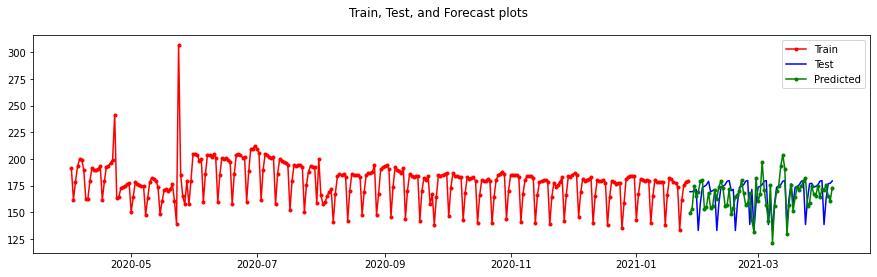

Fitting  NR_MSC_8
Epoch 1/20
10/10 [==============================] - 3s 75ms/step - loss: 834.0042
Epoch 2/20
10/10 [==============================] - 1s 73ms/step - loss: 470.7214
Epoch 3/20
10/10 [==============================] - 1s 72ms/step - loss: 331.9873
Epoch 4/20
10/10 [==============================] - 1s 71ms/step - loss: 311.3059
Epoch 5/20
10/10 [==============================] - 1s 75ms/step - loss: 301.0391
Epoch 6/20
10/10 [==============================] - 1s 72ms/step - loss: 308.6557
Epoch 7/20
10/10 [==============================] - 1s 70ms/step - loss: 303.6786
Epoch 8/20
10/10 [==============================] - 1s 75ms/step - loss: 290.0970
Epoch 9/20
10/10 [==============================] - 1s 76ms/step - loss: 289.7858
Epoch 10/20
10/10 [==============================] - 1s 74ms/step - loss: 294.7043
Epoch 11/20
10/10 [==============================] - 1s 72ms/step - loss: 283.1164
Epoch 12/20
10/10 [==============================] - 1s 74ms/step - loss: 280.

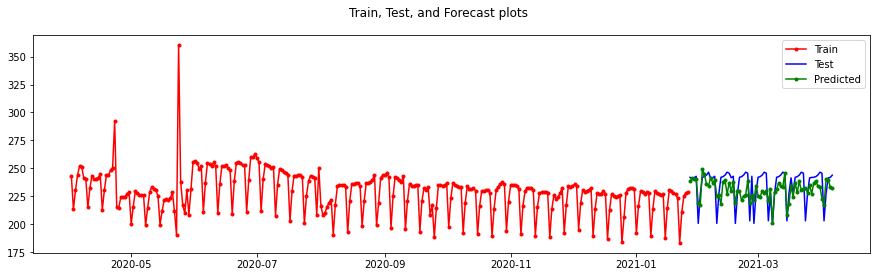

Fitting  NR_MSC_9
Epoch 1/20
10/10 [==============================] - 3s 74ms/step - loss: 943.1782
Epoch 2/20
10/10 [==============================] - 1s 75ms/step - loss: 658.3466
Epoch 3/20
10/10 [==============================] - 1s 75ms/step - loss: 609.8324
Epoch 4/20
10/10 [==============================] - 1s 74ms/step - loss: 609.7355
Epoch 5/20
10/10 [==============================] - 1s 74ms/step - loss: 590.0085
Epoch 6/20
10/10 [==============================] - 1s 82ms/step - loss: 613.3840
Epoch 7/20
10/10 [==============================] - 1s 75ms/step - loss: 615.1583
Epoch 8/20
10/10 [==============================] - 1s 74ms/step - loss: 589.9799
Epoch 9/20
10/10 [==============================] - 1s 73ms/step - loss: 609.7213
Epoch 10/20
10/10 [==============================] - 1s 78ms/step - loss: 585.5020
Epoch 11/20
10/10 [==============================] - 1s 72ms/step - loss: 603.0149
Epoch 12/20
10/10 [==============================] - 1s 72ms/step - loss: 573.

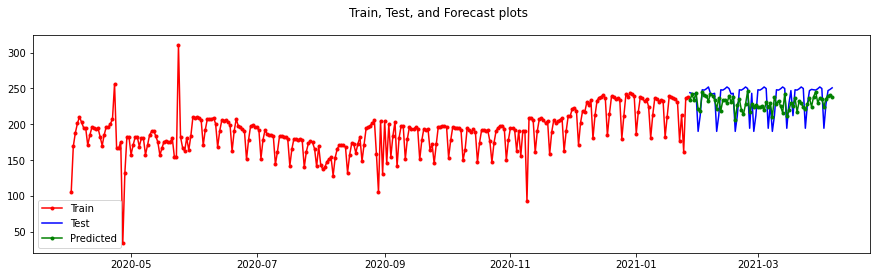

Fitting  NR_MSC_10
Epoch 1/20
10/10 [==============================] - 3s 73ms/step - loss: 845.9586
Epoch 2/20
10/10 [==============================] - 1s 73ms/step - loss: 764.1296
Epoch 3/20
10/10 [==============================] - 1s 73ms/step - loss: 698.1541
Epoch 4/20
10/10 [==============================] - 1s 73ms/step - loss: 1395.1062
Epoch 5/20
10/10 [==============================] - 1s 71ms/step - loss: 715.7445
Epoch 6/20
10/10 [==============================] - 1s 72ms/step - loss: 698.8971
Epoch 7/20
10/10 [==============================] - 1s 77ms/step - loss: 697.6957
Epoch 8/20
10/10 [==============================] - 1s 76ms/step - loss: 677.2638
Epoch 9/20
10/10 [==============================] - 1s 74ms/step - loss: 671.9810
Epoch 10/20
10/10 [==============================] - 1s 74ms/step - loss: 657.0817
Epoch 11/20
10/10 [==============================] - 1s 72ms/step - loss: 699.6430
Epoch 12/20
10/10 [==============================] - 1s 72ms/step - loss: 79

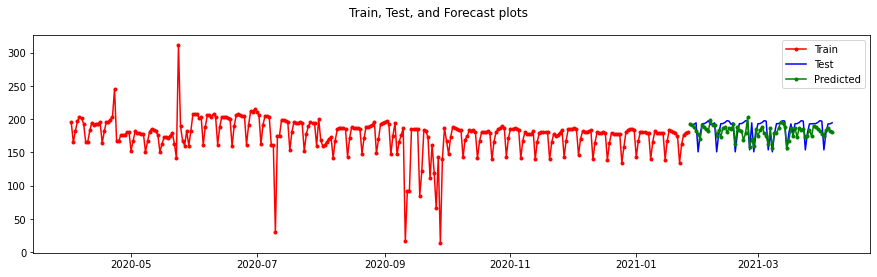

In [ ]:
f15d, f1m, f3m = models(data, 300)

## Three months Forecaset

In [ ]:
f15d.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,171.984299,166.763107,244.202393,351.904907,325.854065,175.479645,182.579117,-293.908478,192.200104,137.209076
2021-04-08,171.981506,166.755630,244.303543,352.096405,326.493652,175.416656,182.827393,-867.385132,192.330414,137.082016
2021-04-09,171.983444,166.748596,244.401154,352.282318,327.123108,175.353546,182.899460,-2627.476807,192.646576,137.012863
2021-04-10,171.989136,166.742050,244.495438,352.462463,327.742645,175.291641,182.698853,-4131.575195,193.034302,136.899750
2021-04-11,171.996048,166.736008,244.586685,352.637024,328.352478,175.231750,182.581436,-4671.170898,193.300980,136.766602


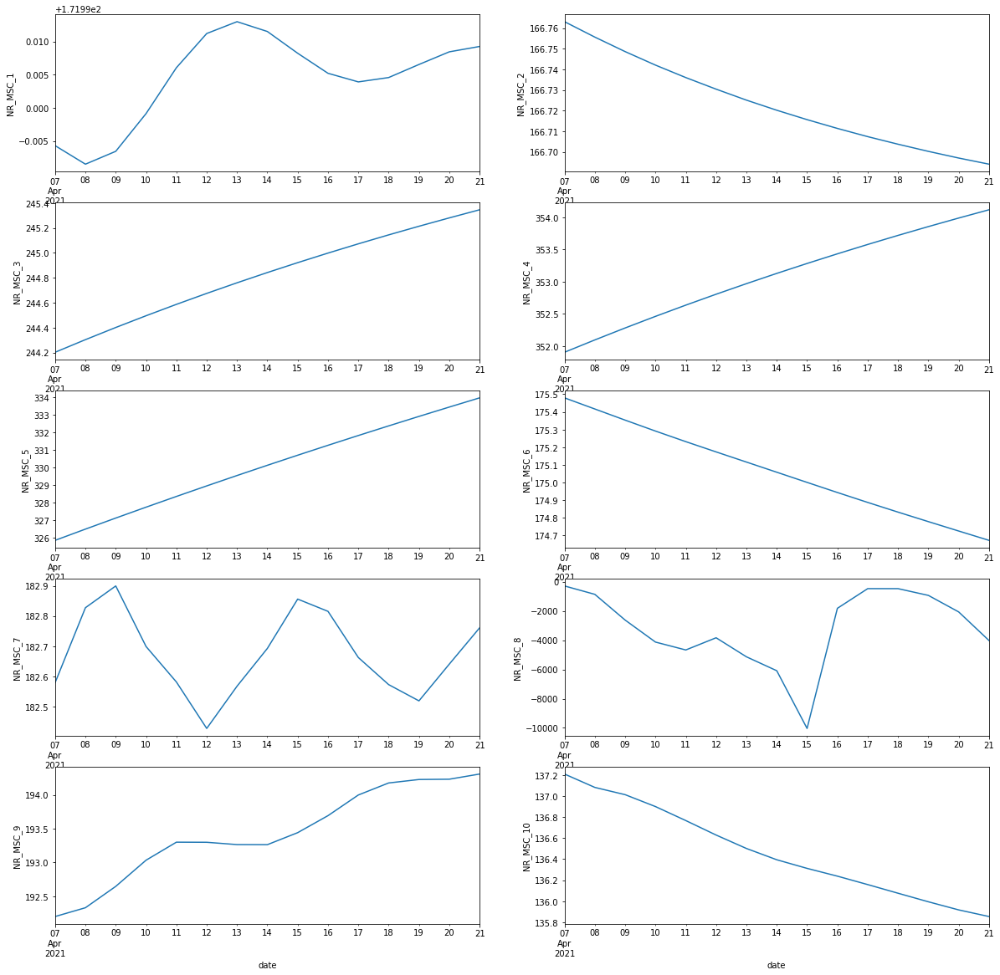

In [ ]:
plot_forecasts(f15d)

## Six months forecast

In [ ]:
f1m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,171.984299,166.763107,244.202393,351.904907,325.854065,175.479645,182.579117,-293.908478,192.200104,137.209076
2021-04-08,171.981506,166.755630,244.303543,352.096405,326.493652,175.416656,182.827393,-867.385132,192.330414,137.082016
2021-04-09,171.983444,166.748596,244.401154,352.282318,327.123108,175.353546,182.899460,-2627.476807,192.646576,137.012863
2021-04-10,171.989136,166.742050,244.495438,352.462463,327.742645,175.291641,182.698853,-4131.575195,193.034302,136.899750
2021-04-11,171.996048,166.736008,244.586685,352.637024,328.352478,175.231750,182.581436,-4671.170898,193.300980,136.766602


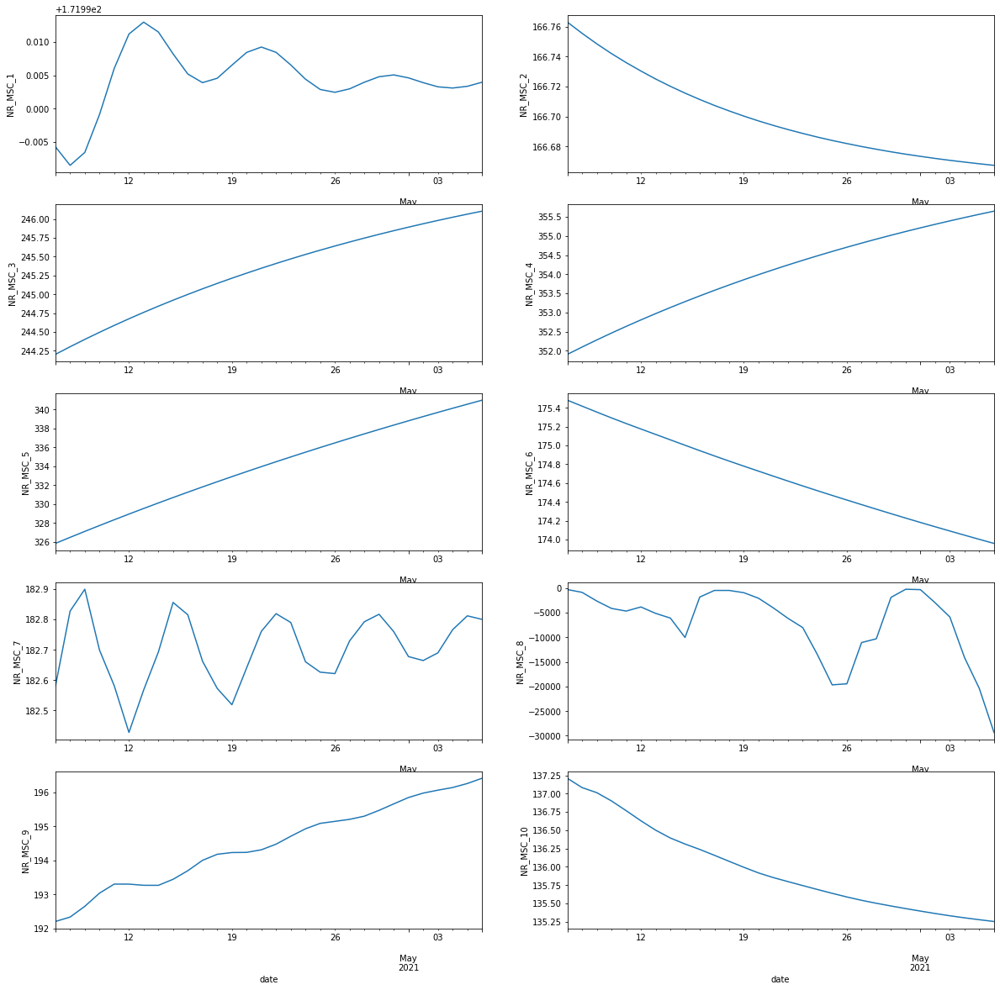

In [ ]:
plot_forecasts(f1m)

# One year forecast

In [ ]:
f3m.head()

,NR_MSC_1,NR_MSC_2,NR_MSC_3,NR_MSC_4,NR_MSC_5,NR_MSC_6,NR_MSC_7,NR_MSC_8,NR_MSC_9,NR_MSC_10
Date,,,,,,,,,,
2021-04-07,171.984299,166.763107,244.202393,351.904907,325.854065,175.479645,182.579117,-293.908478,192.200104,137.209076
2021-04-08,171.981506,166.755630,244.303543,352.096405,326.493652,175.416656,182.827393,-867.385132,192.330414,137.082016
2021-04-09,171.983444,166.748596,244.401154,352.282318,327.123108,175.353546,182.899460,-2627.476807,192.646576,137.012863
2021-04-10,171.989136,166.742050,244.495438,352.462463,327.742645,175.291641,182.698853,-4131.575195,193.034302,136.899750
2021-04-11,171.996048,166.736008,244.586685,352.637024,328.352478,175.231750,182.581436,-4671.170898,193.300980,136.766602


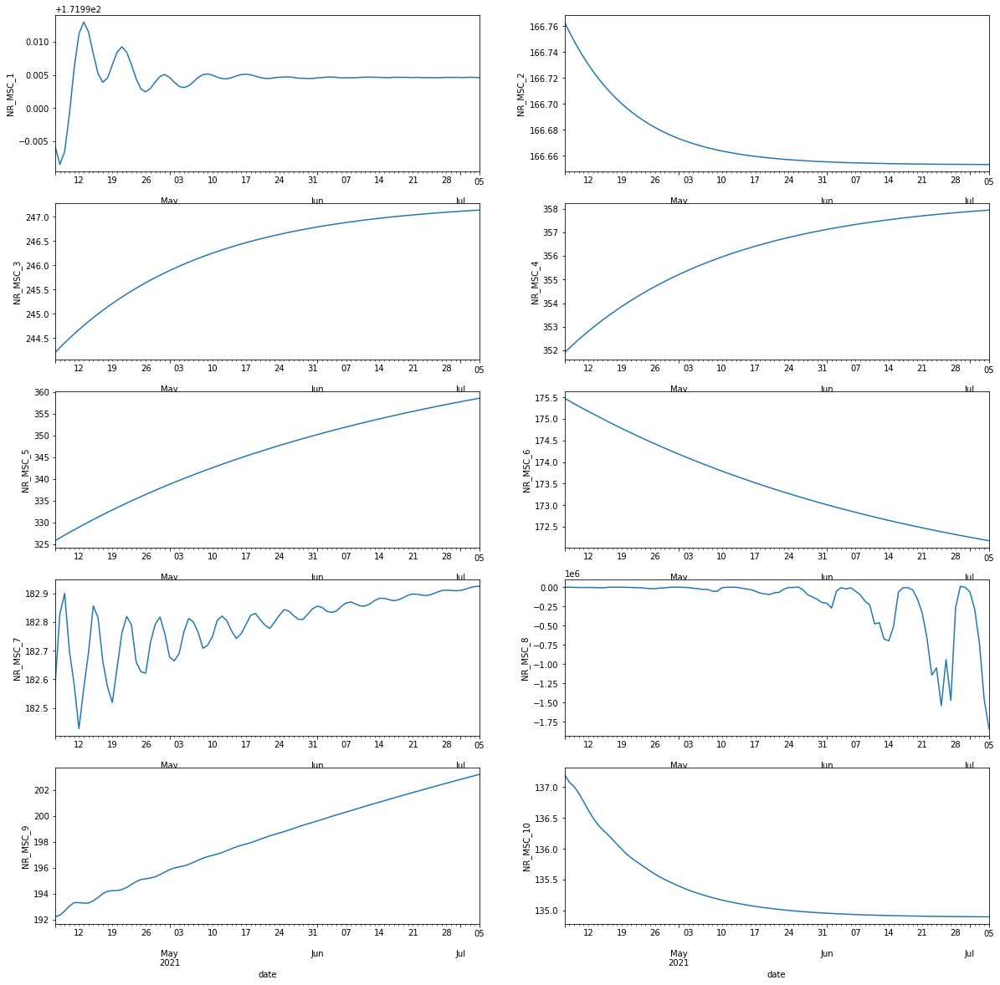

In [ ]:
plot_forecasts(f3m)